(20631, 26)
(185, 23)
[[2.73100853e-04 0.00000000e+00 0.00000000e+00 5.00850001e-01
  5.70216721e+00 8.80836918e+00 0.00000000e+00 1.03411494e-03
  8.84733015e-01 7.24960189e-02 3.93284084e+00 0.00000000e+00
  2.72992293e-01 7.60353568e-01 7.04389659e-02 4.15269634e+00
  3.77476557e-02 0.00000000e+00 1.47235544e+00 0.00000000e+00
  0.00000000e+00 1.67349151e-01 1.06117440e-01]]


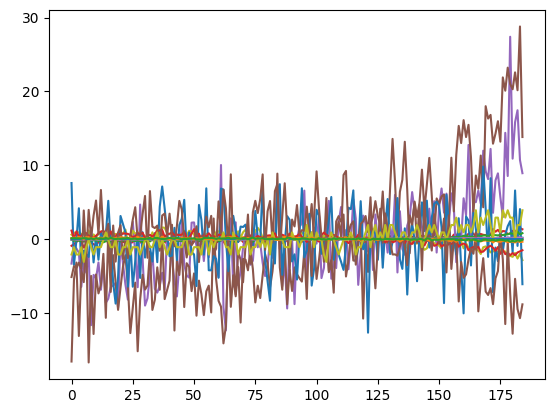

In [1]:
# Load data
import numpy as np
import matplotlib.pyplot as plt

np.random.seed(42)

data = np.loadtxt("train_FD001.txt") # DOWNLOAD THE DATA FROM THE LINK IN THE PAPER
print(data.shape)

xs = []
starting_points = np.where(data[:, 1] == 1.0)[0]
for i in range(0, len(starting_points) - 1):
    x = data[
        starting_points[i]:starting_points[i+1],
        3:
    ]

    x -= np.mean(x, axis=0, keepdims=True)
    # x = (x / np.std(x, axis=0, keepdims=True))[:, np.std(x, axis=0) > 0]

    x = x[:, np.all(np.isfinite(x), axis=0)]

    xs.append(x)

print(x.shape)
plt.plot(x)
print(np.std(x, axis=0, keepdims=True))

In [2]:
from rhythmic_sharing import RhythmicNetwork

from tqdm import tqdm
import numpy as np

best_mse = np.inf

for sr in tqdm(np.linspace(0.2, 0.8, 10)):
    for iw in np.linspace(0.25, 1.0, 10):
        for l in np.linspace(0.5, 0.95, 10):
            network = RhythmicNetwork(
                # Tune Rhythmic Sharing
                dt=10,
                input_dims=x.shape[1],
                spectral_radius=sr,
                input_weight=iw,
                average_degree_nodes=8,
                num_nodes=512, # 256
                leakage=l,
                # Rhythmic params
                link_strength_change_ratio=0
            )

            network.train(x.T[:, :-100])
            pred = network.predict(x.T[:, -110:], warmup_time=10)
            mse = np.mean(np.square((pred[:, 1:] - x.T[:, -100:]))) # /np.std(pred[:, 1:], axis=1, keepdims=True)))
            if mse > 100_000_000:
                network.lsqrs = not network.lsqrs
            
            if mse < best_mse:
                print("New best %.10f" % mse, (sr, iw, l))
                best_esn_param = (sr, iw, l)
                best_mse = mse

  0%|                                                                                           | 0/10 [00:00<?, ?it/s]

New best 312100.9393893445 (np.float64(0.2), np.float64(0.25), np.float64(0.5))
New best 224925.5458615414 (np.float64(0.2), np.float64(0.25), np.float64(0.65))


  0%|                                                                                           | 0/10 [00:33<?, ?it/s]


KeyboardInterrupt: 

  0%|                                                                                           | 0/10 [00:00<?, ?it/s]

New best 0.0222479244 (np.float64(0.25), np.float64(0.05), np.float64(0.3), np.float64(0.01))


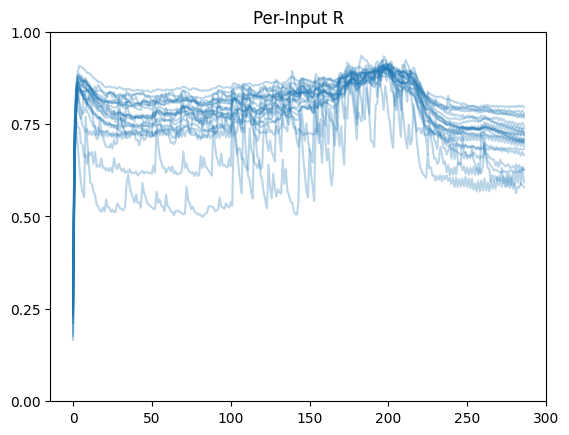

New best 0.0224454872 (np.float64(0.25), np.float64(0.05), np.float64(0.3), np.float64(0.27))


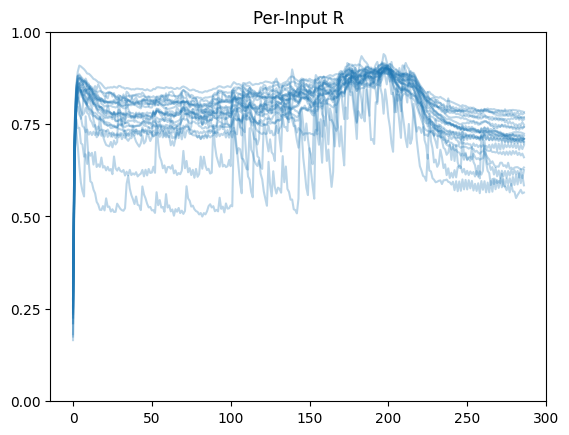

 10%|████████                                                                        | 1/10 [07:29<1:07:26, 449.62s/it]

New best 0.0260327709 (np.float64(0.25), np.float64(0.03888888888888889), np.float64(0.3), np.float64(0.01))


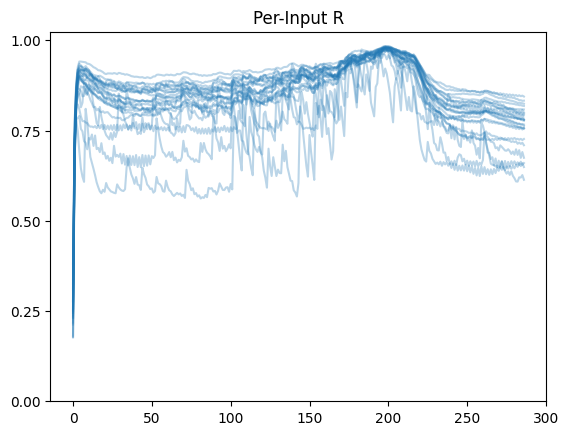

New best 0.0262373775 (np.float64(0.25), np.float64(0.03888888888888889), np.float64(0.3), np.float64(0.27))


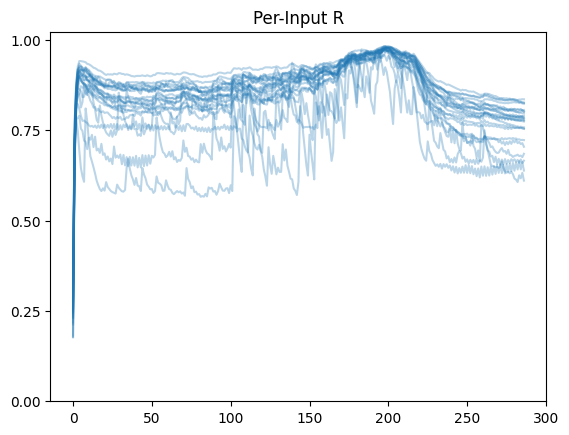

 40%|████████████████████████████████▊                                                 | 4/10 [29:34<44:08, 441.40s/it]

New best 0.0358710487 (np.float64(0.25), np.float64(0.005555555555555557), np.float64(0.37777777777777777), np.float64(0.01))


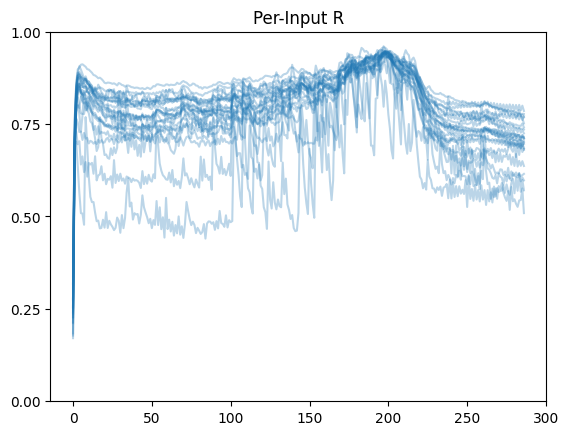

New best 0.0359080578 (np.float64(0.25), np.float64(0.005555555555555557), np.float64(0.37777777777777777), np.float64(0.05333333333333334))


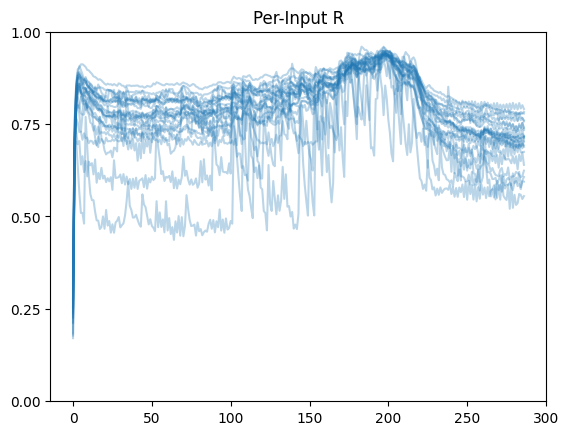

New best 0.0364567286 (np.float64(0.25), np.float64(0.005555555555555557), np.float64(0.37777777777777777), np.float64(0.09666666666666666))


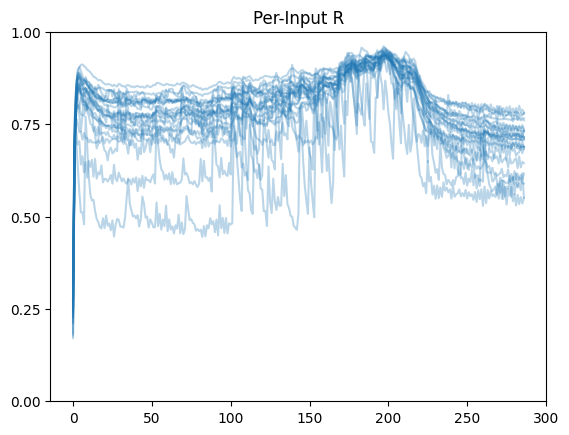

 70%|█████████████████████████████████████████████████████████▍                        | 7/10 [50:50<21:29, 429.71s/it]

New best 0.0401713569 (np.float64(0.25), np.float64(-0.02777777777777778), np.float64(0.45555555555555555), np.float64(0.01))


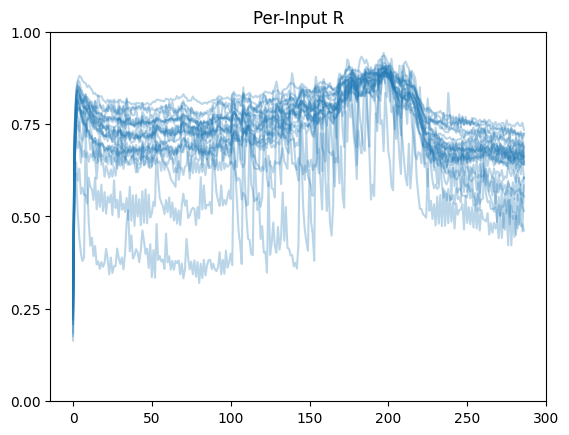

 80%|█████████████████████████████████████████████████████████████████▌                | 8/10 [57:55<14:16, 428.11s/it]

New best 0.0480963752 (np.float64(0.25), np.float64(-0.03888888888888889), np.float64(0.45555555555555555), np.float64(0.01))


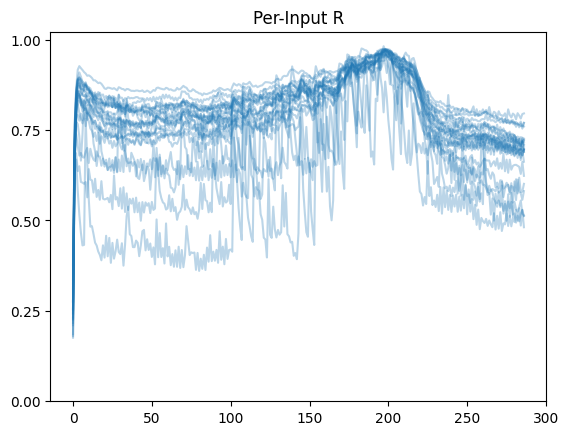

  0%|                                                                                           | 0/10 [00:27<?, ?it/s]


KeyboardInterrupt: 

In [14]:
best_difference = 0
for lsr in np.linspace(0.25, 1, 10):
    for e1 in tqdm(np.linspace(-0.05, 0.05, 10)[::-1]): # tqdm(np.linspace(-0.1, -0.0, 10)[::-1]):
        for o in np.linspace(0.01, 0.4, 10):
            for e2 in np.linspace(0.3, 1.0, 10):
                network = RhythmicNetwork(
                    # Tune Rhythmic Sharing
                    dt=10,
                    input_dims=x.shape[1],
                    spectral_radius=best_esn_param[0],
                    input_weight=best_esn_param[1],
                    average_degree_nodes=8,
                    num_nodes=512, #256,
                    leakage=best_esn_param[2],
                    # Rhythmic params
                    link_strength_change_ratio=lsr,
                    omega0=o,
                    epsilon1=e1,
                    epsilon2=e2,
                )

                network.train(x.T, warmup_time=0)
                r = network.get_global_parameters()[0]
                sixty_per = int(len(r) * 0.6)
    
                diff = np.std(r[sixty_per:]) - np.std(r[:sixty_per]) #/np.mean(r.T[:250])
                
                if diff > best_difference and np.mean(r.T[:sixty_per]) > 0.5: # np.mean(network.get_input_parameters()[0].T[75:100, 11]) > 0.5: # and np.mean(network.get_input_parameters()[0].T[75:100, 15]) > 0.5:
                    print("New best %.10f" % diff, (lsr, e1, e2, o))
                    best_param_rhy = (lsr, e1, e2, o)
                    best_difference = diff
    
                    plt.title("Per-Input R")
                    plt.plot(network.get_input_parameters()[0].T, color="tab:blue", alpha=0.3)
                    plt.yticks([0, 0.25, 0.5, 0.75, 1])
                    plt.show()

In [5]:
best_esn_param = (0.8, 0.83, 0.65) # best_esn_param = (0.8, 0.75, 0.5) # best_esn_param = (0.8, 1, 0.5)
best_param_rhy = (0.25, -0.039, 0.456, 0.01) # best_param_rhy = (0.75, -0.18, 0.76, 0.31)

In [6]:
# Run all datasets through detector

global_rs = []
input_rs = []
num_chan = x.shape[1]

for x in tqdm(xs):
    network = RhythmicNetwork(
        # Tune Rhythmic Sharing
        dt=10,
        input_dims=x.shape[1],
        spectral_radius=best_esn_param[0],
        input_weight=best_esn_param[1],
        average_degree_nodes=8,
        num_nodes=512,
        leakage=best_esn_param[2],
        # Rhythmic params
        link_strength_change_ratio=best_param_rhy[0],
        omega0=best_param_rhy[3],
        epsilon1=best_param_rhy[1],
        epsilon2=best_param_rhy[2],
    )
    
    network.train(x.T, warmup_time=0)
    global_rs.append(network.get_global_parameters()[0])
    input_rs.append(network.get_input_parameters()[0])

print(len(xs), len(input_rs))

100%|██████████████████████████████████████████████████████████████████████████████████| 99/99 [09:48<00:00,  5.95s/it]

99 99


In [16]:
from drift_helpers.mmdagg import mmdagg

# MMDAgg-based Drift Detector (pseudocode)
# Works like river: you call update(x_t) per timestep.

class MMDAggDriftDetector:
    def __init__(self, window_size=32, step_size=1, alpha=0.001):
        self.reference_buffer = []
        self.test_buffer = []
        self.window_size = window_size
        self.step_size = step_size
        self.alpha = alpha
        self.drift_detected = False
        self.num_samples_seen = 0

    def update(self, x_t):
        """
        x_t : np.ndarray (shape = [n_channels]) or list
        """
        self.num_samples_seen += 1
        self.test_buffer.append(x_t)

        # When test window full, run drift test
        if len(self.test_buffer) >= self.window_size:
            if len(self.reference_buffer) >= self.window_size:

                # Run MMDAgg two-sample test
                self.drift_detected = mmdagg(np.asarray(self.reference_buffer), np.asarray(self.test_buffer), alpha=self.alpha) == 1
                if self.drift_detected:
                    self._on_drift()
                    
            # Slide windows
            self.reference_buffer = (
                self.reference_buffer[-self.window_size:] + self.test_buffer[:self.step_size]
            )
            self.test_buffer = self.test_buffer[self.step_size:]

        return self.drift_detected

    def _on_drift(self):
        # Reset reference window to post-drift data (optional)
        self.reference_buffer = self.test_buffer.copy()
        self.test_buffer = []
        # Optionally log or emit signal
        # print(f"Drift detected at t={self.num_samples_seen}")

0it [00:00, ?it/s]

0.00075


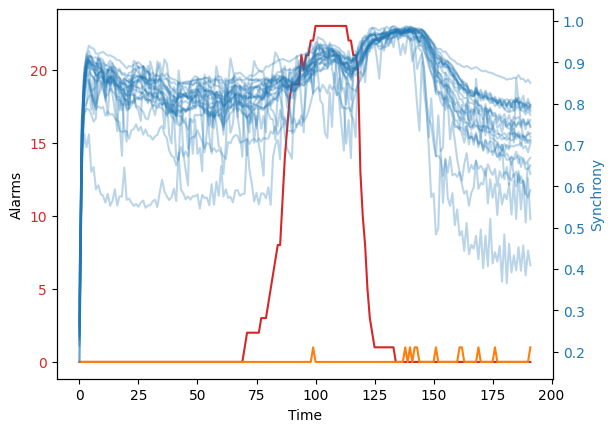

1it [00:01,  1.90s/it]

[ 0.  0.  2.  5.  6.  7.  8.  9. 11. 11. 11. 12. 12. 12. 13. 13. 14. 14.
 15. 19. 19. 23. 25.]
0.00075


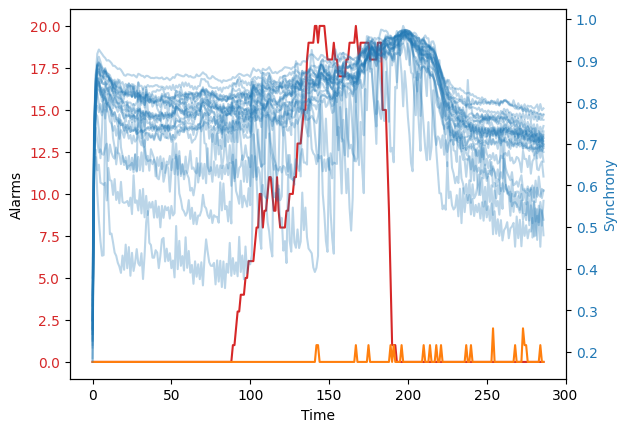

2it [00:05,  2.63s/it]

[14. 16. 17. 19. 22. 24. 28. 29. 31. 31. 37. nan nan nan nan nan nan nan
 nan nan nan nan nan]
0.00075


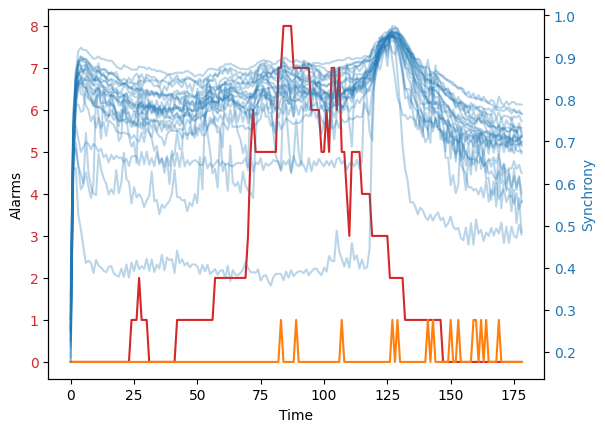

3it [00:06,  2.22s/it]

[ 0.  0.  0.  0.  0.  7.  7.  9. nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan]
0.00075


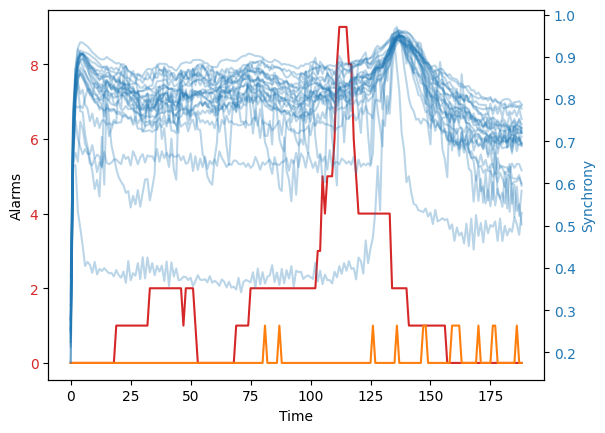

4it [00:08,  2.11s/it]

[ 0.  0. 28. 30. 30. 35. 36. 36. 37. nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan]
0.00075


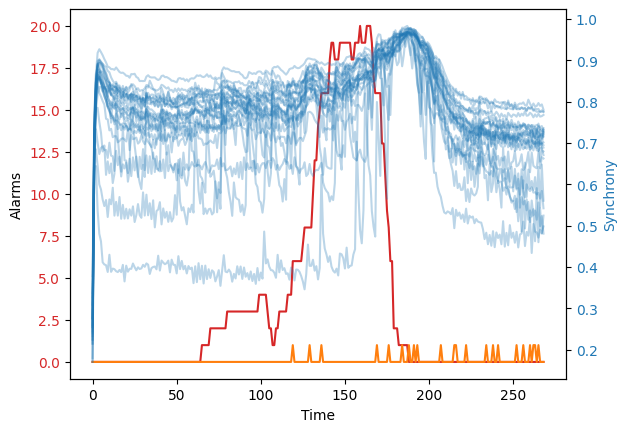

5it [00:11,  2.40s/it]

[ 0.  0.  5. 24. 44. 44. nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan]
0.00075


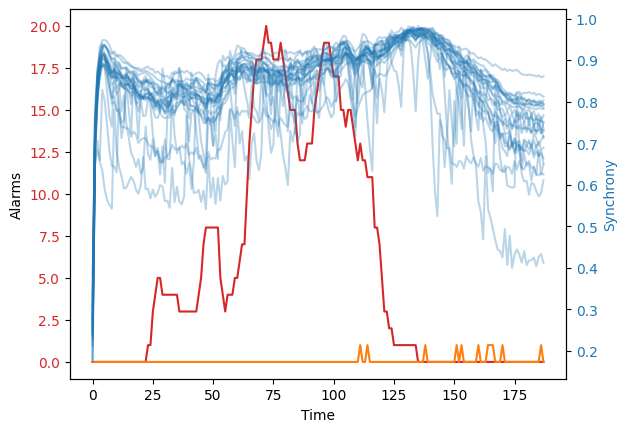

6it [00:13,  2.21s/it]

[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  3. nan nan nan nan]
0.00075


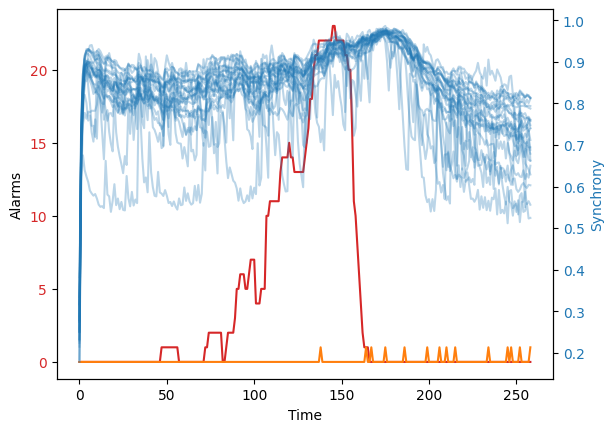

7it [00:16,  2.42s/it]

[ 0.  0. 14. 15. 15. 17. 23. 32. 32. 32. 34. 40. 40. 41. 45. nan nan nan
 nan nan nan nan nan]
0.00075


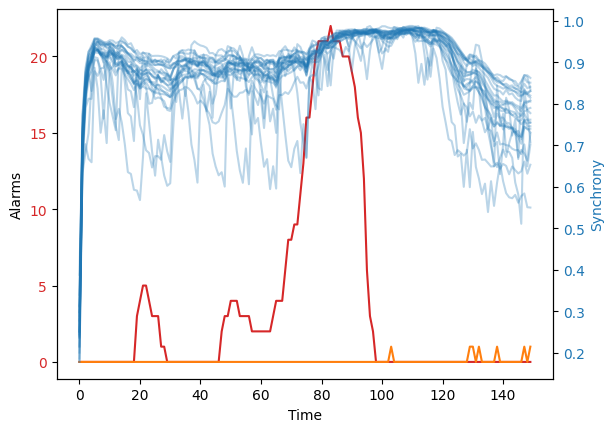

8it [00:17,  2.08s/it]

[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  2.  2.
  3.  3.  4.  8. nan]
0.00075


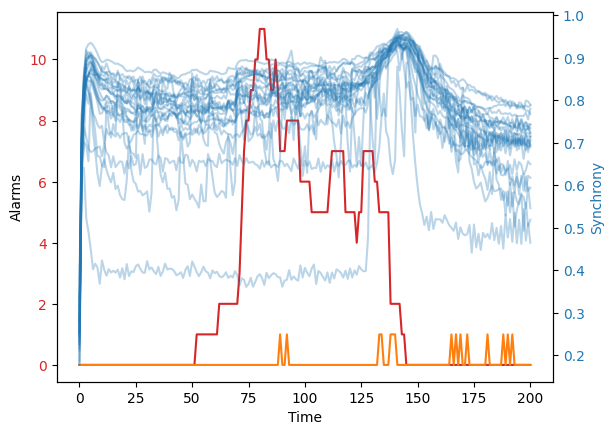

9it [00:19,  2.07s/it]

[ 0.  0.  0.  0.  0.  0.  0.  0.  1.  3.  5. nan nan nan nan nan nan nan
 nan nan nan nan nan]
0.00075


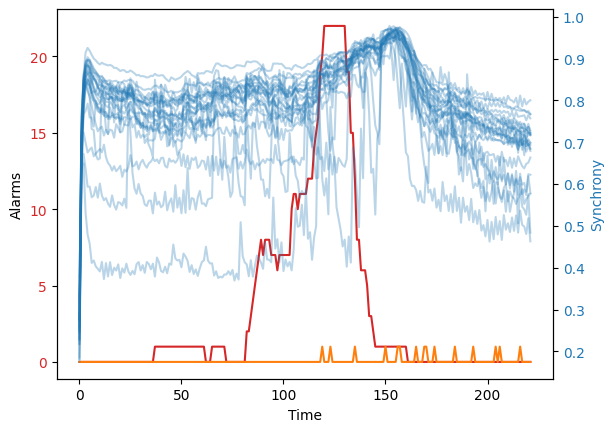

10it [00:21,  2.12s/it]

[ 7.  7.  9. 10. 11. 12. 13. 14. 29. 29. 30. 37. 40. 40. 41. 42. 43. 43.
 43. 44. 45. 45. nan]
0.00075


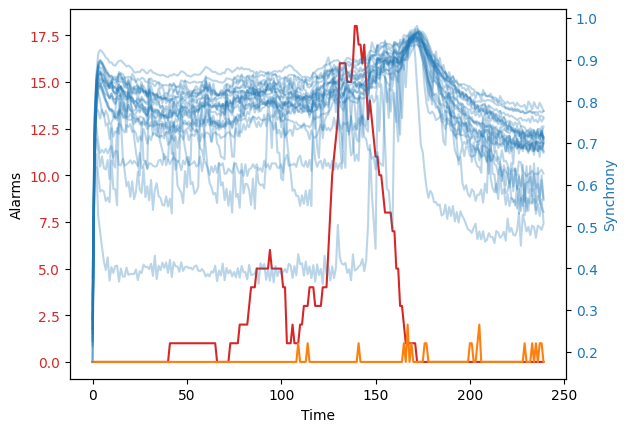

11it [00:24,  2.26s/it]

[ 0.  3.  8.  9. 12. 19. nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan]
0.00075


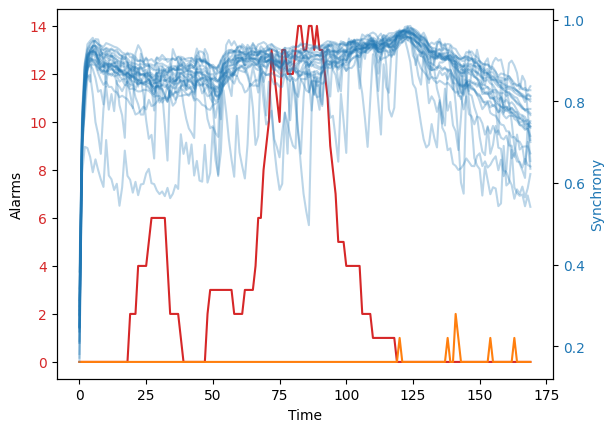

12it [00:26,  2.14s/it]

[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  1.  1.  1.  7. nan nan nan nan
 nan nan nan nan nan]
0.00075


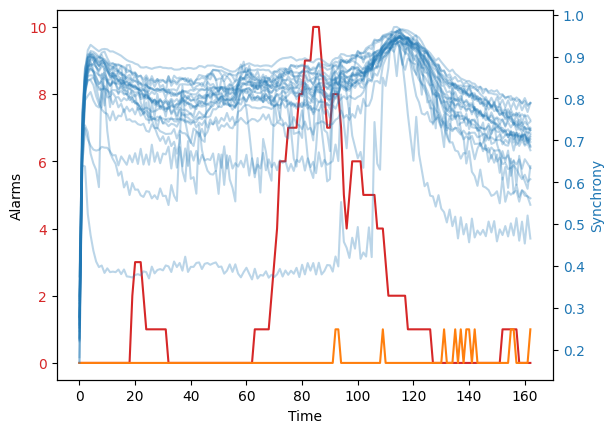

13it [00:27,  1.96s/it]

[ 0.  0.  0.  0.  0.  0.  0.  4.  6.  9. nan nan nan nan nan nan nan nan
 nan nan nan nan nan]
0.00075


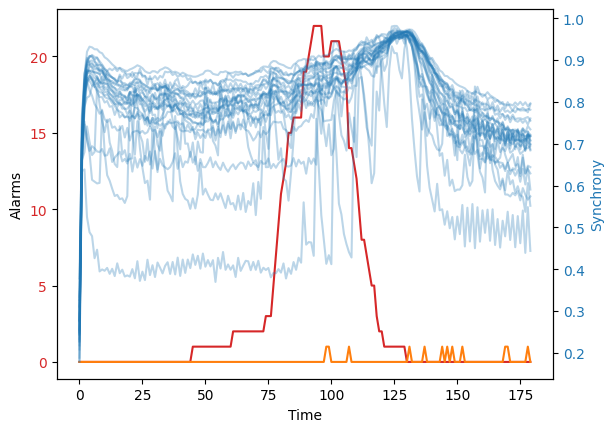

14it [00:29,  1.89s/it]

[ 0.  0.  0.  2.  2.  3.  3.  4.  4.  5.  5.  6.  7.  8.  8. 10. 14. 14.
 14. 16. 17. 18. nan]
0.00075


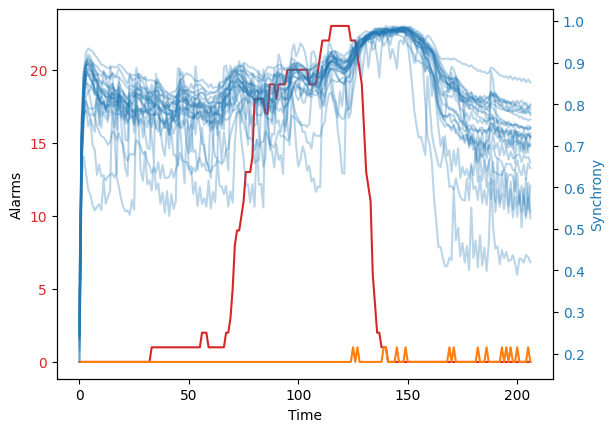

15it [00:31,  1.95s/it]

[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  1.  1.  4.  5.  5.  5.  5.
 12. 20. 35. 36. 40.]
0.00075


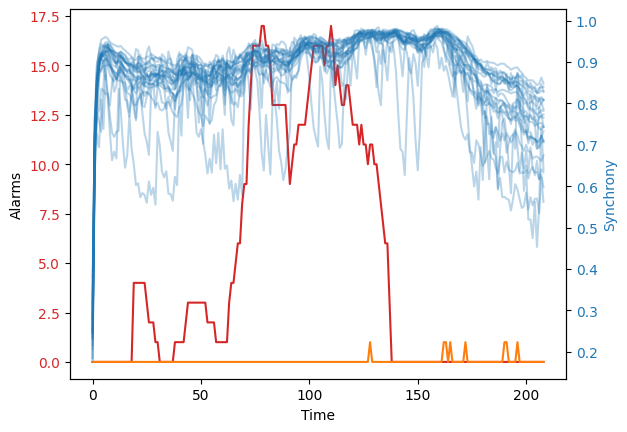

16it [00:34,  2.05s/it]

[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  3. nan
 nan nan nan nan nan]
0.00075


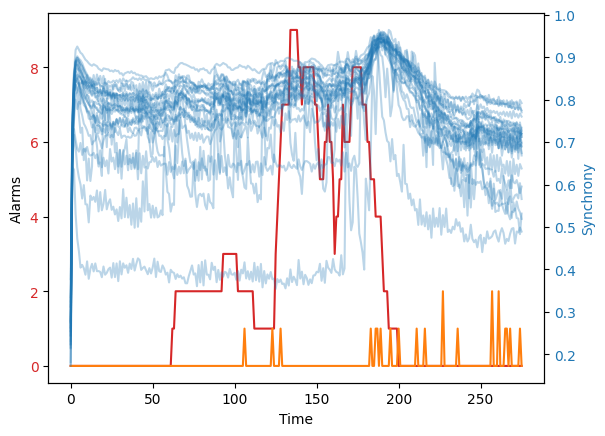

17it [00:37,  2.36s/it]

[ 0.  0. 18. nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan]
0.00075


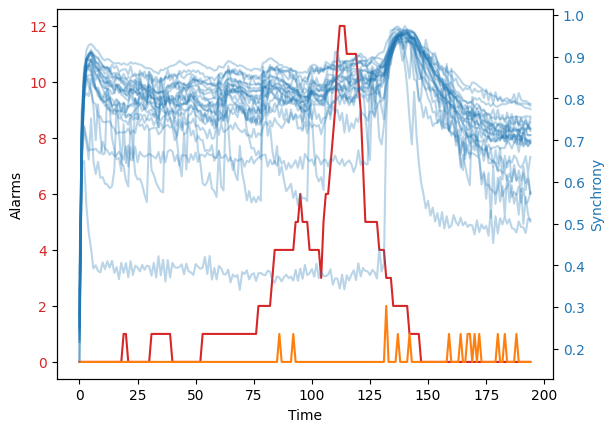

18it [00:39,  2.27s/it]

[ 0.  2.  8.  9. 18. 20. 33. 34. 35. 36. 36. 37. nan nan nan nan nan nan
 nan nan nan nan nan]
0.00075


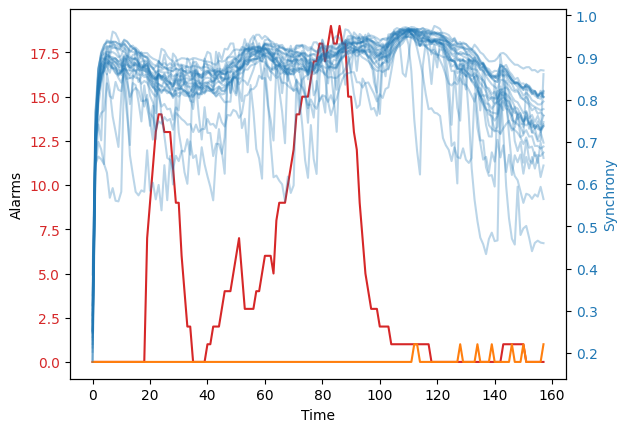

19it [00:40,  2.03s/it]

[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  1.  2.  4.
  8. nan nan nan nan]
0.00075


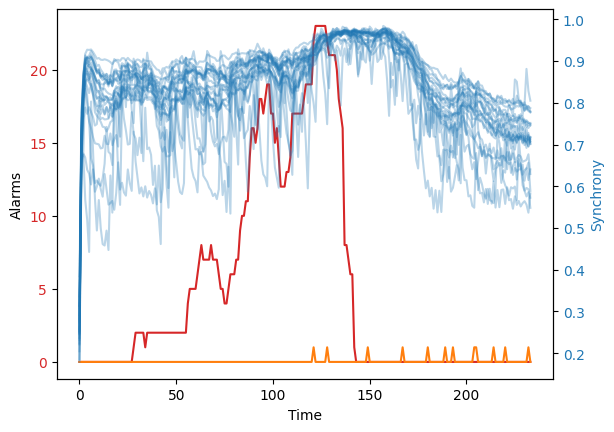

20it [00:43,  2.17s/it]

[ 0.  0.  0.  0.  2.  3.  6.  8.  8.  9. 11. 13. 13. 13. 14. 14. 18. 18.
 22. 46. 46. 46. 47.]
0.00075


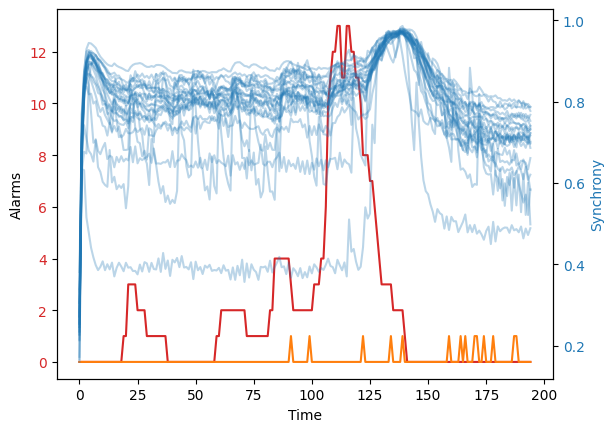

21it [00:45,  2.14s/it]

[ 0.  7.  9.  9. 31. 31. 32. 32. 32. 32. 33. 34. 36. nan nan nan nan nan
 nan nan nan nan nan]
0.00075


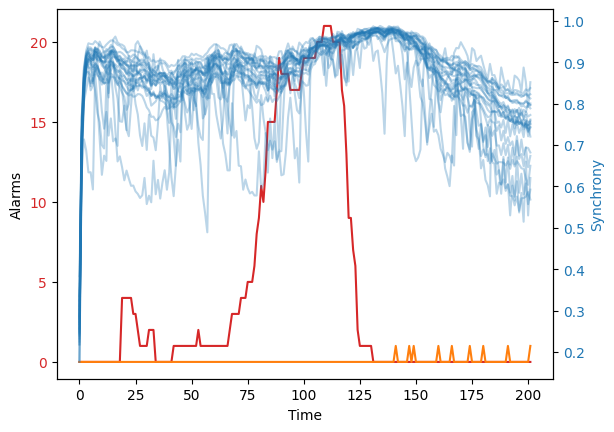

22it [00:47,  2.13s/it]

[ 0.  0.  0.  0.  0.  3.  4.  4.  5.  6.  6.  8.  9.  9.  9. 13. 13. 14.
 14. 31. 34. nan nan]
0.00075


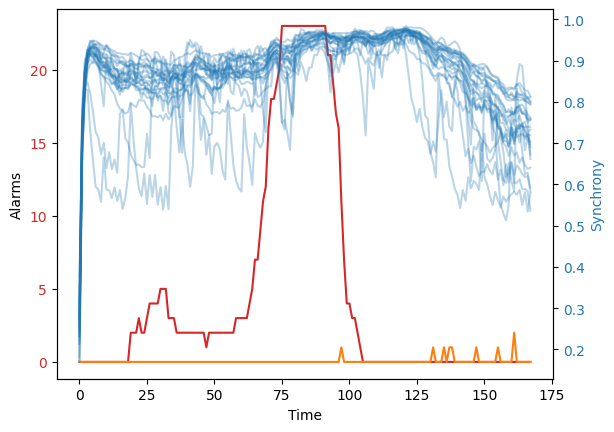

23it [00:48,  1.97s/it]

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
0.00075


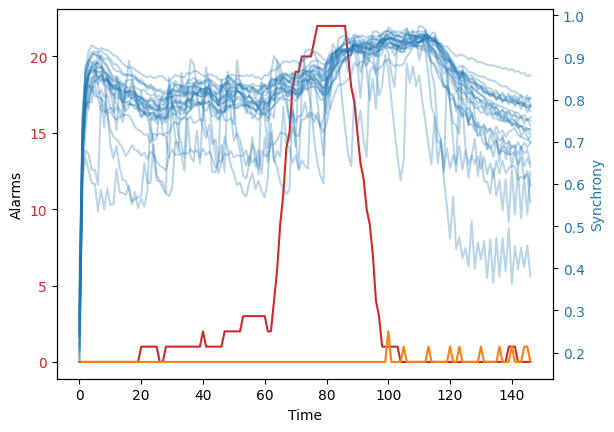

24it [00:50,  1.77s/it]

[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  1.  2. nan]
0.00075


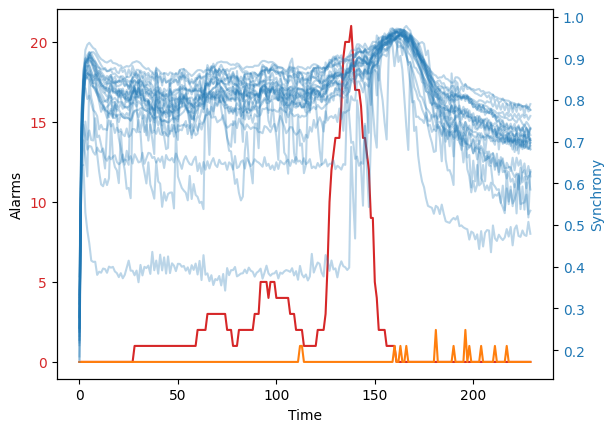

25it [00:52,  2.01s/it]

[ 0.  0. 14. 17. 17. nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan]
0.00075


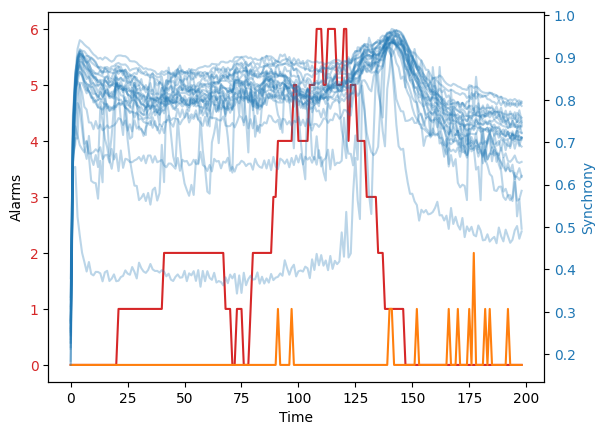

26it [00:54,  2.03s/it]

[ 0.  5. 14. 16. 23. 33. nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan]
0.00075


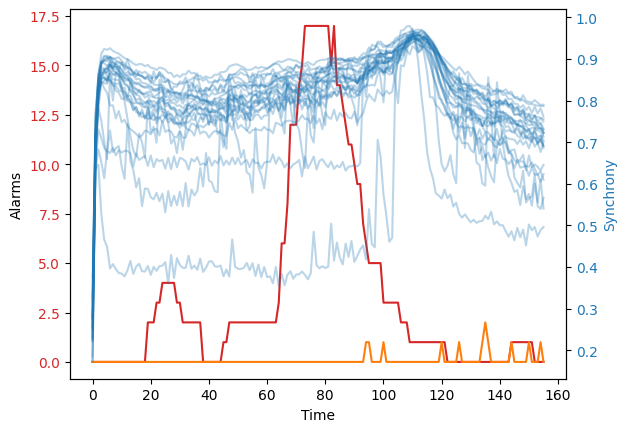

27it [00:56,  1.85s/it]

[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0. nan
 nan nan nan nan nan]
0.00075


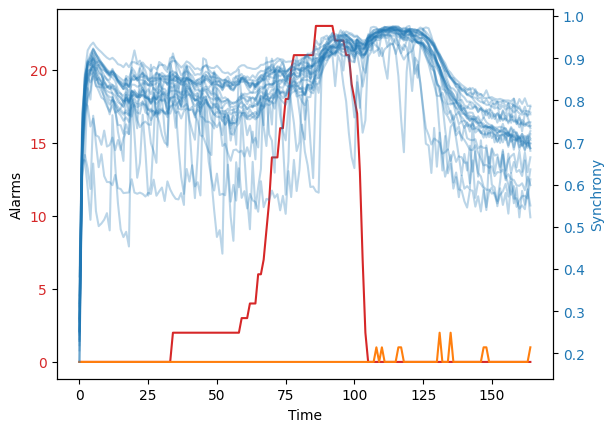

28it [00:57,  1.74s/it]

[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  2.  2.  3. 11. 11.]
0.00075


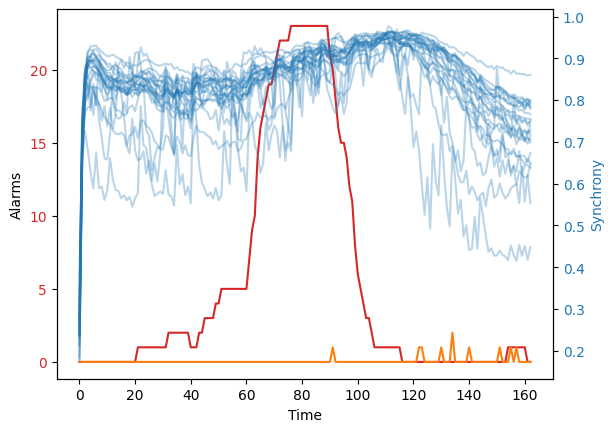

29it [00:59,  1.67s/it]

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
0.00075


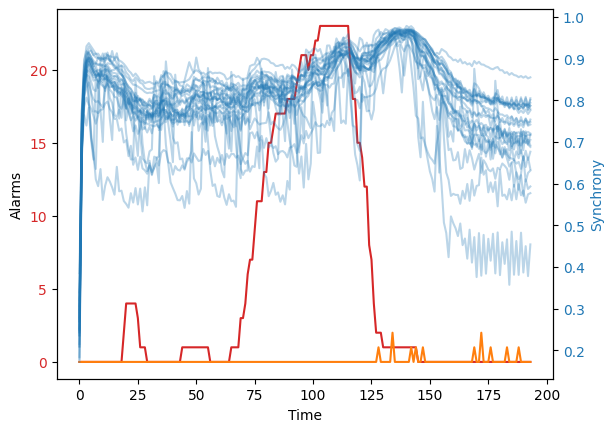

30it [01:01,  1.74s/it]

[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  1.  1.  4.  4.  6.  6.  8.  9. 14.
 18. 19. 20. 26. 28.]
0.00075


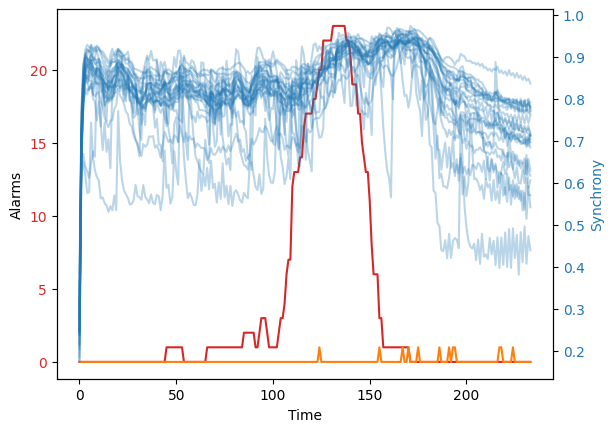

31it [01:03,  1.94s/it]

[ 0. 10. 19. 31. 32. 32. 33. 35. 35. 35. 35. 35. 36. 39. 41. 41. 42. 46.
 48. 49. nan nan nan]
0.00075


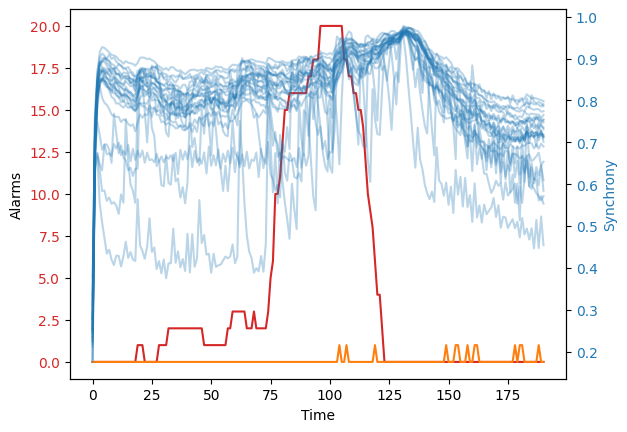

32it [01:05,  1.94s/it]

[ 0.  0.  0.  0.  0.  1.  2.  2.  2.  2.  4.  5.  5.  6.  6.  8. 16. 18.
 21. 21. nan nan nan]
0.00075


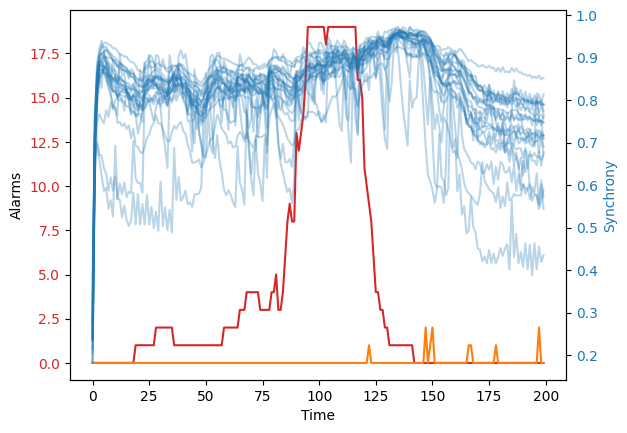

33it [01:07,  2.01s/it]

[ 0.  0.  0.  4.  6. 10. 11. 11. 12. 15. 15. 15. 15. 18. 19. 19. 20. 20.
 20. nan nan nan nan]
0.00075


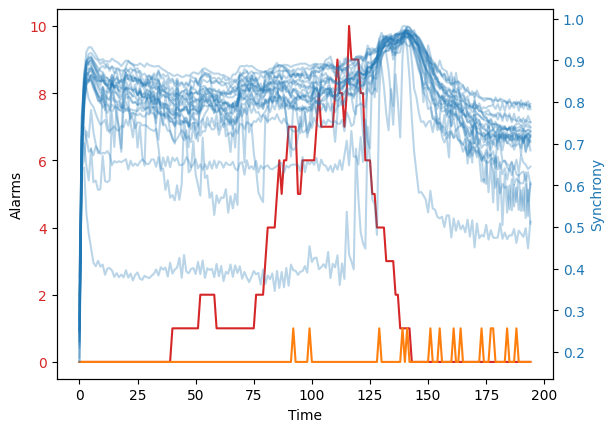

34it [01:09,  2.00s/it]

[ 0.  1.  5.  6. 10. 11. 15. 28. 36. 41. nan nan nan nan nan nan nan nan
 nan nan nan nan nan]
0.00075


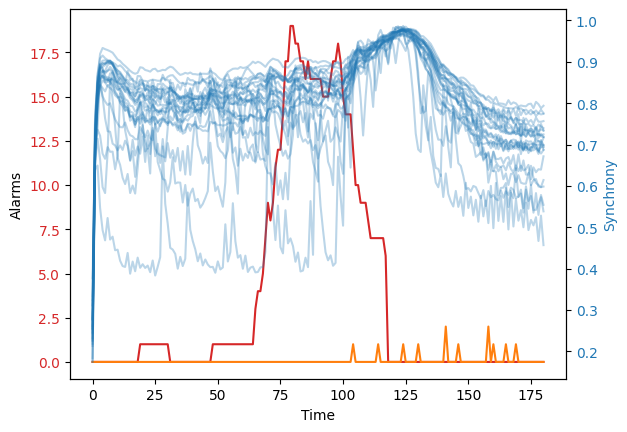

35it [01:11,  1.92s/it]

[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  1.  1.  2.  2.  2.  4.
  4. nan nan nan nan]
0.00075


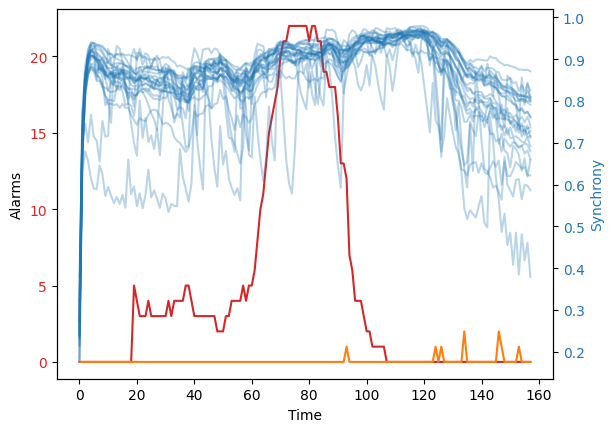

36it [01:12,  1.78s/it]

[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0. nan]
0.00075


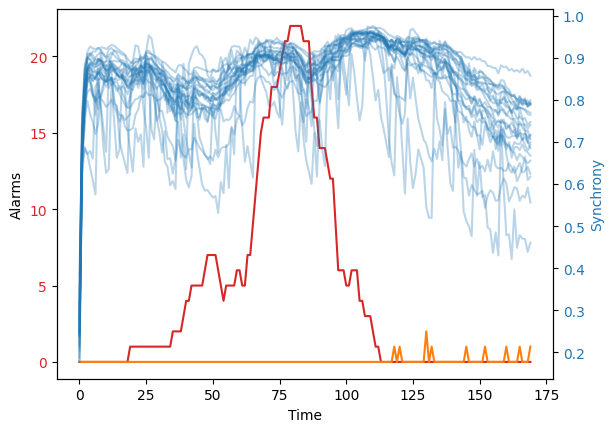

37it [01:14,  1.72s/it]

[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  1.  2.  4. nan]
0.00075


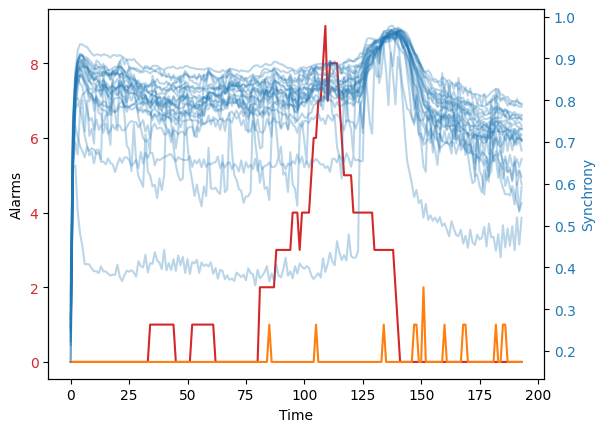

38it [01:16,  1.81s/it]

[ 6.  6. 13. 20. 28. 29. 31. 33. 34. nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan]
0.00075


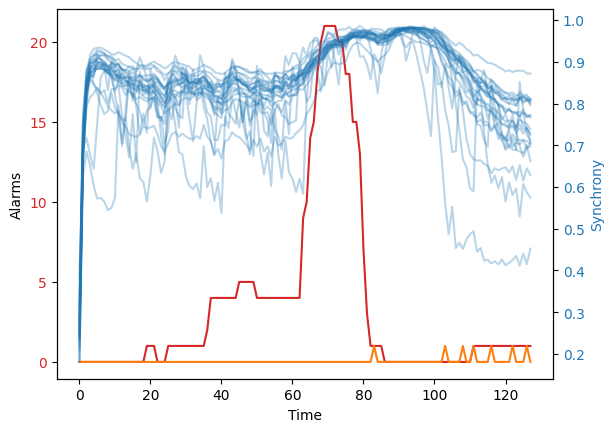

39it [01:17,  1.59s/it]

[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
 nan nan nan nan nan]
0.00075


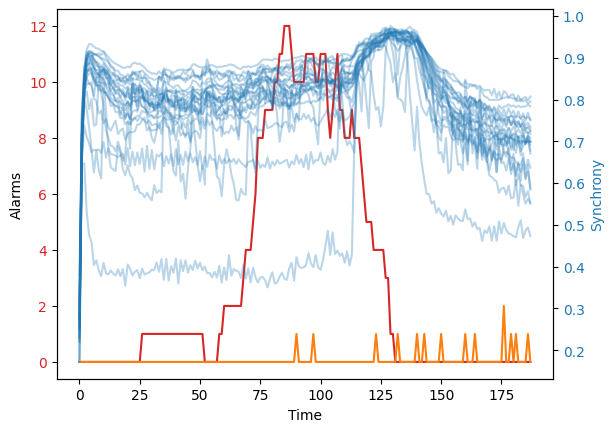

40it [01:19,  1.68s/it]

[ 0.  0.  0.  0.  0.  0.  0.  0.  2.  6.  8. 10. nan nan nan nan nan nan
 nan nan nan nan nan]
0.00075


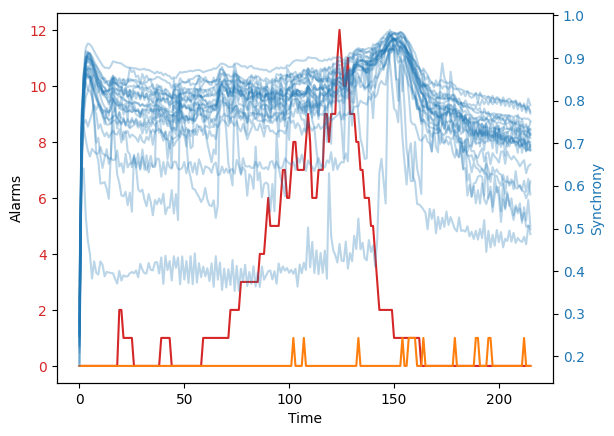

41it [01:21,  1.83s/it]

[ 0.  0.  2. 11. 14. 15. 22. 27. 34. 48. 48. 49. nan nan nan nan nan nan
 nan nan nan nan nan]
0.00075


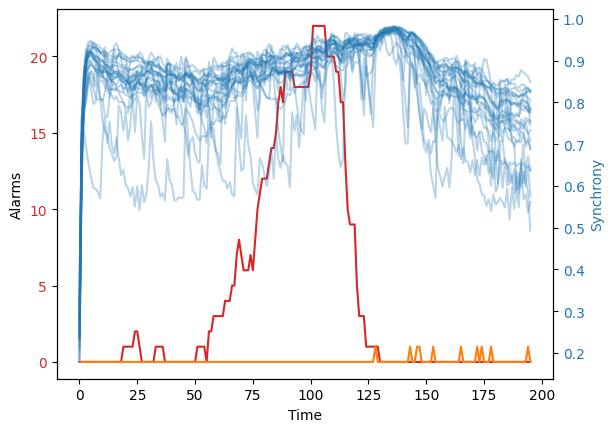

42it [01:23,  1.88s/it]

[ 0.  0.  0.  0.  0.  0.  1.  1.  2.  2.  3.  4.  7.  8. 10. 11. 11. 12.
 14. 26. 26. 26. nan]
0.00075


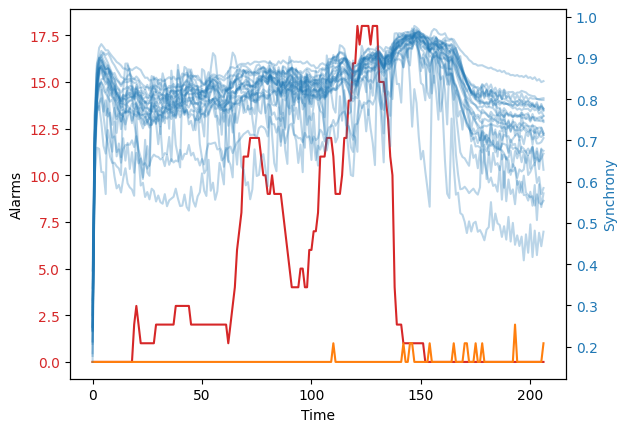

43it [01:25,  1.95s/it]

[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0. 42. 42. 44. 44. 46. 46.
 nan nan nan nan nan]
0.00075


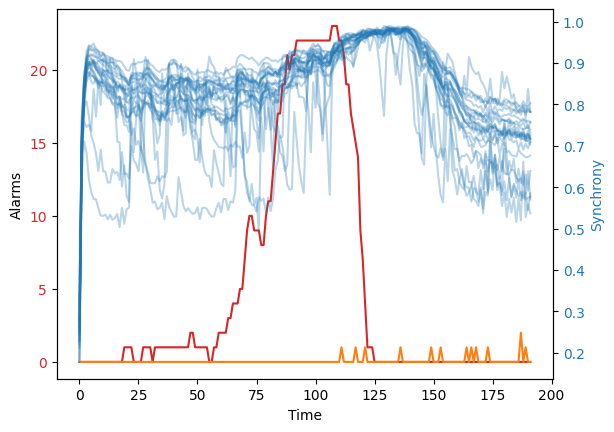

44it [01:27,  1.92s/it]

[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  4.  5.  7.  7.  8.  8.  9.  9. 11.
 11. 13. 13. 17. 32.]
0.00075


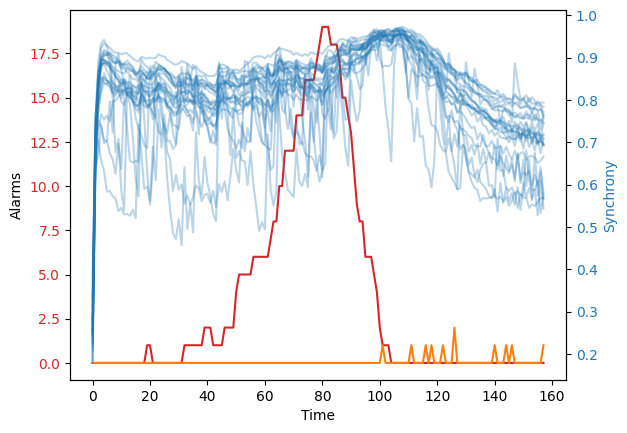

45it [01:29,  1.77s/it]

[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  3.  4.
  5. nan nan nan nan]
0.00075


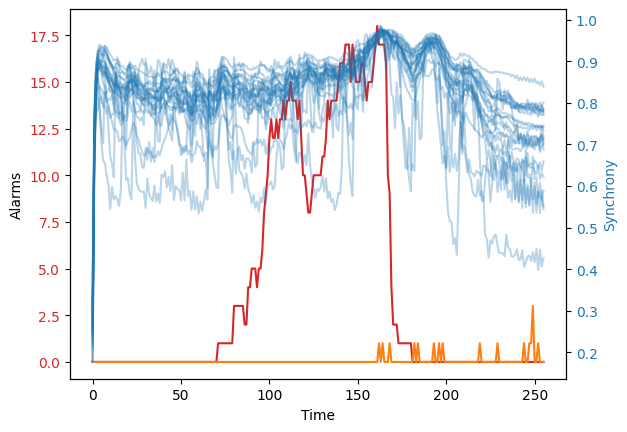

46it [01:31,  2.07s/it]

[ 0.  5.  5. 13. 15. 21. 22. 22. 23. 24. 25. 25. 26. 33. 37. nan nan nan
 nan nan nan nan nan]
0.00075


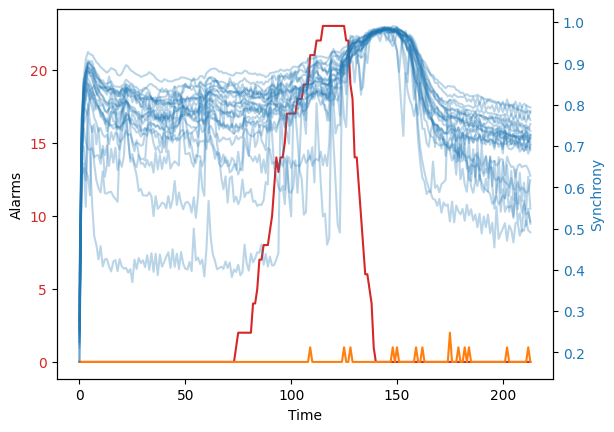

47it [01:33,  2.09s/it]

[ 0.  0.  7.  7.  9. 10. 10. 12. 15. 16. 17. 17. 18. 18. 22. 23. 23. 28.
 31. 34. 34. 37. 40.]
0.00075


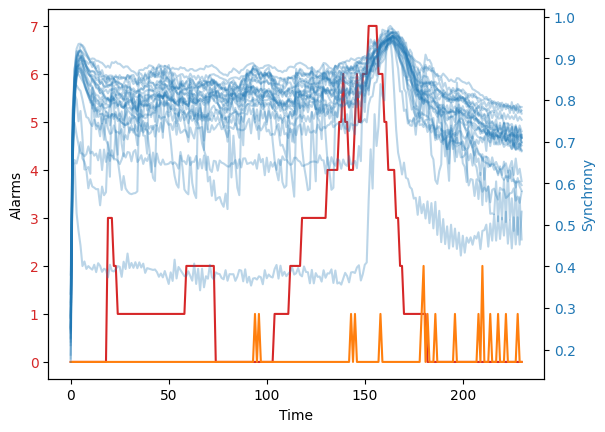

48it [01:36,  2.22s/it]

[29. 37. 43. nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan]
0.00075


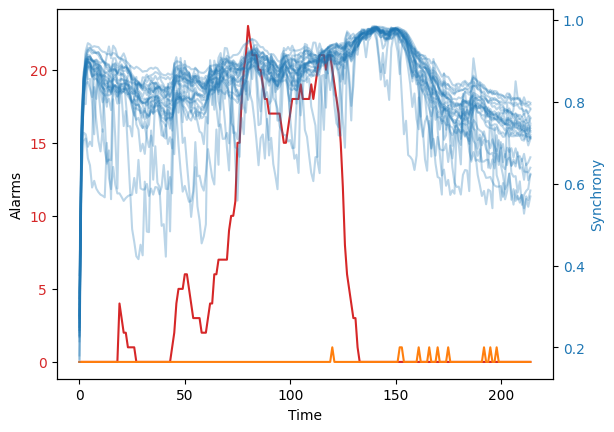

49it [01:38,  2.20s/it]

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 2. 2. 2. 3. 3. 4. 5. 5.]
0.00075


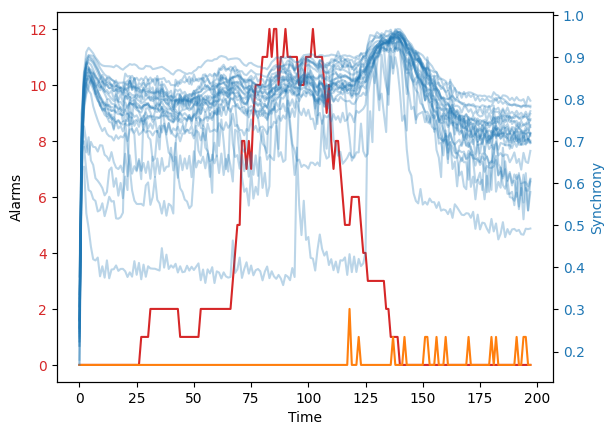

50it [01:40,  2.11s/it]

[ 0.  0.  0.  0.  0.  0.  0.  1.  1.  2.  5.  8. nan nan nan nan nan nan
 nan nan nan nan nan]
0.00075


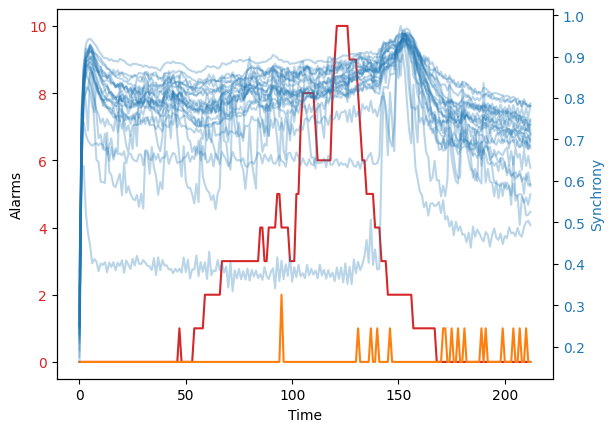

51it [01:42,  2.15s/it]

[ 0.  0.  0. 10. 18. 29. 29. 30. 45. 46. nan nan nan nan nan nan nan nan
 nan nan nan nan nan]
0.00075


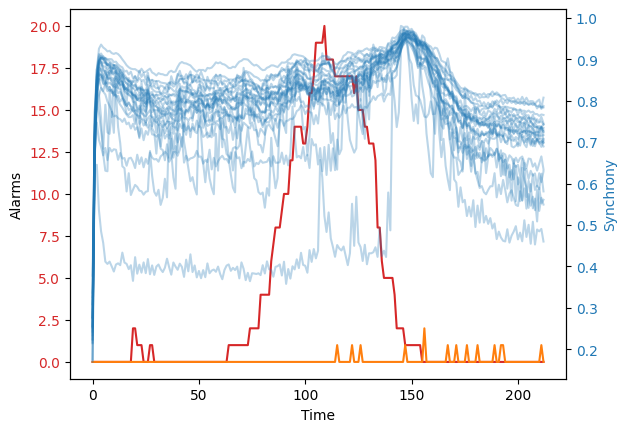

52it [01:44,  2.16s/it]

[ 0.  0.  4.  4.  9.  9. 10. 11. 14. 15. 18. 18. 20. 20. 27. 27. 29. 30.
 30. 34. nan nan nan]
0.00075


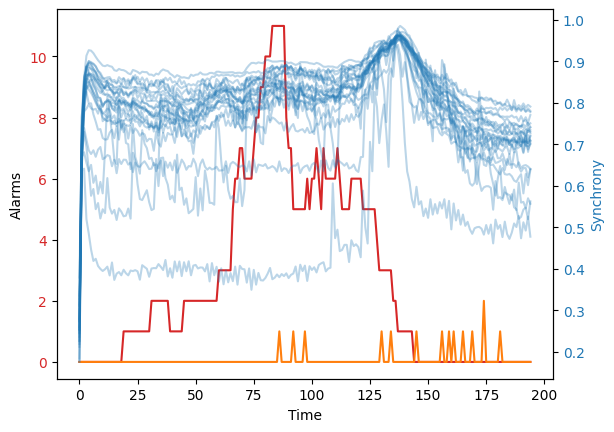

53it [01:47,  2.15s/it]

[ 0.  0.  0.  0.  0.  0.  0.  1.  3.  5.  8. nan nan nan nan nan nan nan
 nan nan nan nan nan]
0.00075


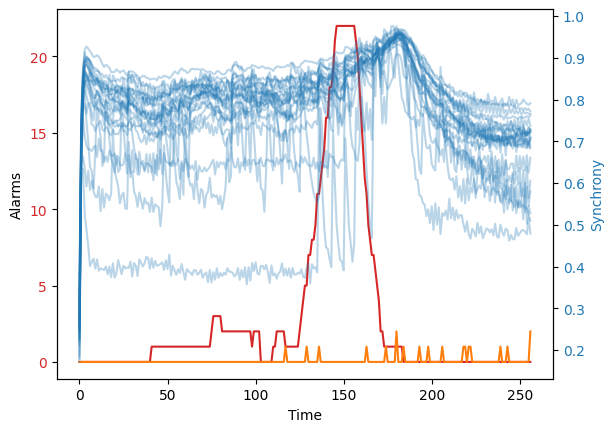

54it [01:49,  2.32s/it]

[ 0.  0.  1. nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan]
0.00075


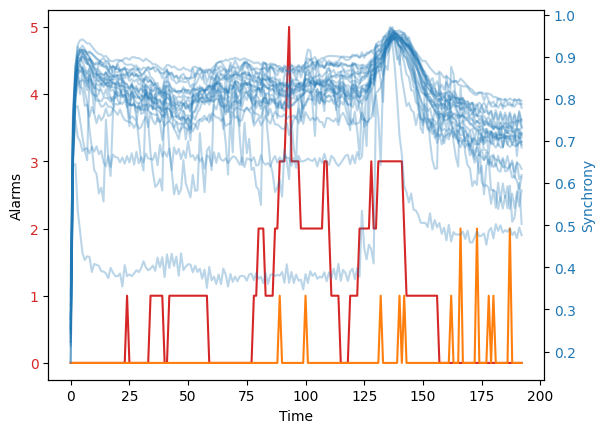

55it [01:51,  2.24s/it]

[ 3.  5. 14. 17. 18. nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan]
0.00075


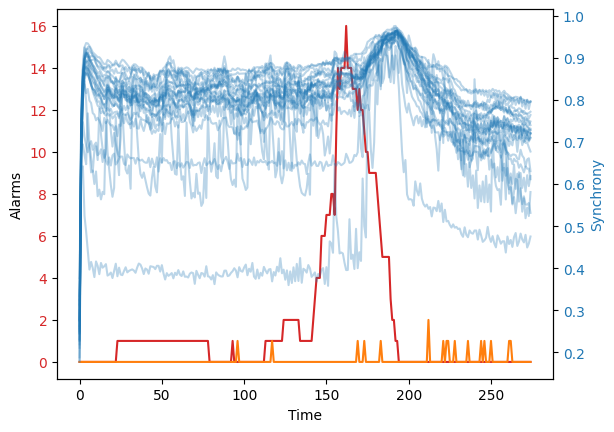

56it [01:55,  2.53s/it]

[ 0. 49. nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan]
0.00075


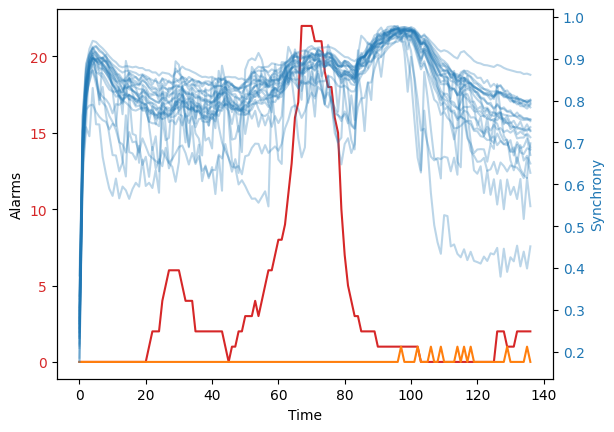

57it [01:56,  2.12s/it]

[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
 nan nan nan nan nan]
0.00075


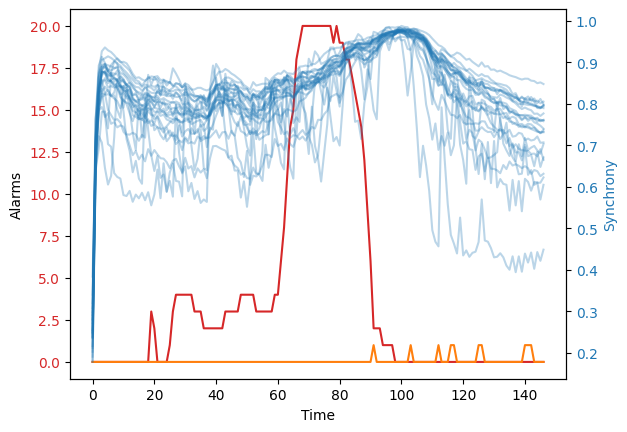

58it [01:57,  1.88s/it]

[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0. nan nan nan]
0.00075


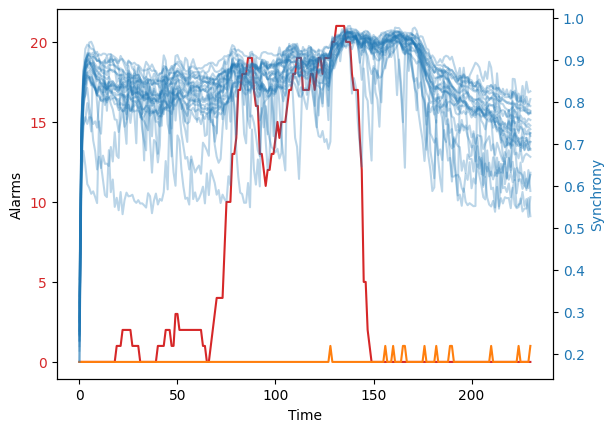

59it [01:59,  2.05s/it]

[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  3.  3.  3.  5.  6.  6.  6.  8.
 11. nan nan nan nan]
0.00075


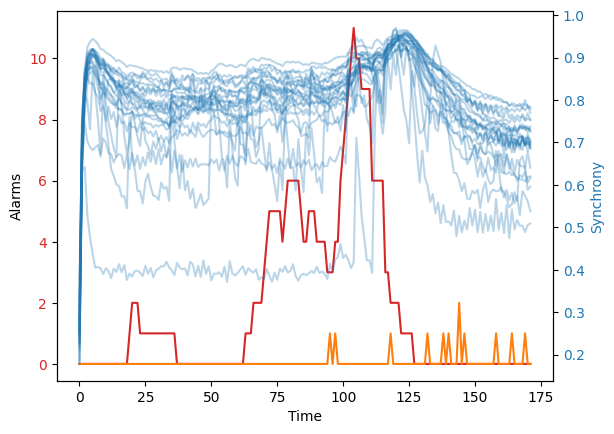

60it [02:01,  1.94s/it]

[ 0.  0.  0.  0.  0.  4. 25. 26. 27. 28. 29. nan nan nan nan nan nan nan
 nan nan nan nan nan]
0.00075


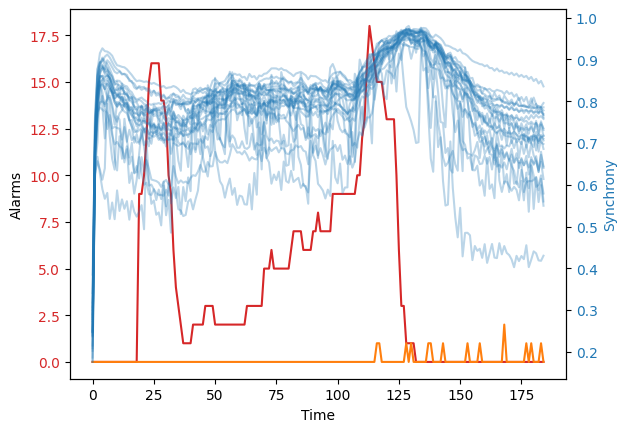

61it [02:03,  1.90s/it]

[ 0.  0.  0.  0.  0.  6.  7. 17. 23. 33. 35. 35. 36. 37. 37. 37. 38. 38.
 nan nan nan nan nan]
0.00075


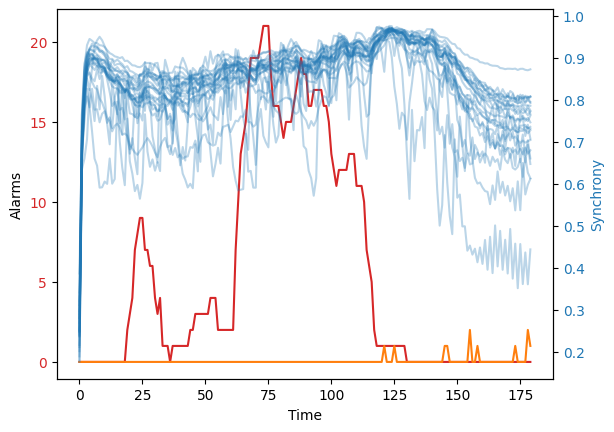

62it [02:05,  1.87s/it]

[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0. nan nan]
0.00075


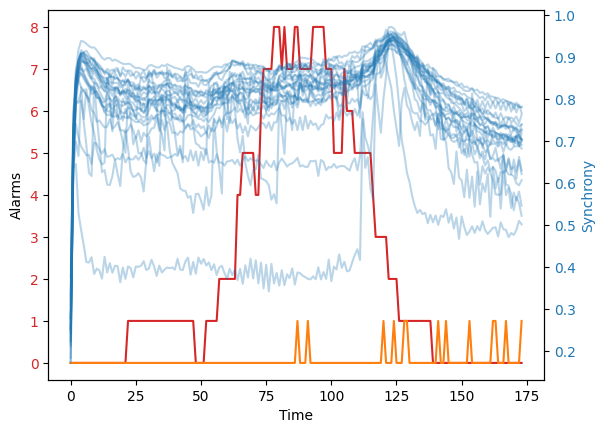

63it [02:06,  1.83s/it]

[ 0.  0.  0.  0.  0.  0.  0.  3. nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan]
0.00075


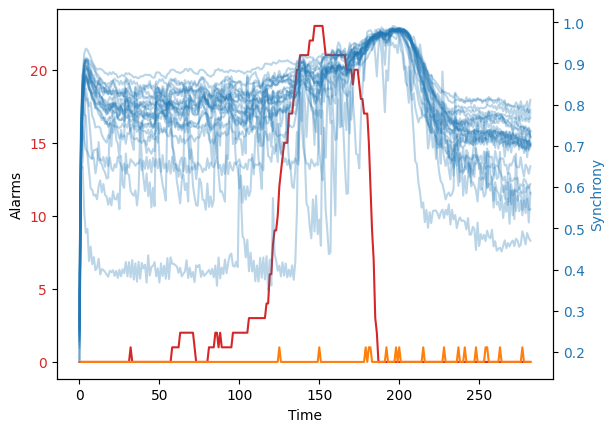

64it [02:10,  2.25s/it]

[ 6. 10. 31. 42. 44. 44. 46. 46. 47. 49. nan nan nan nan nan nan nan nan
 nan nan nan nan nan]
0.00075


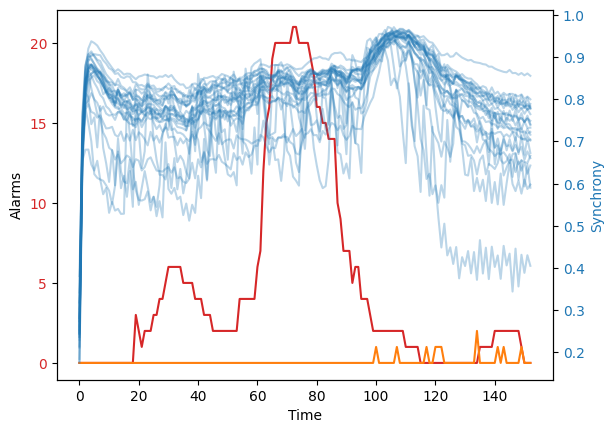

65it [02:11,  1.99s/it]

[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0. nan nan nan]
0.00075


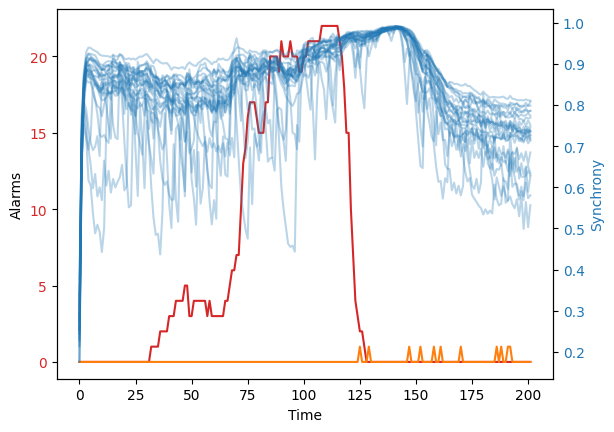

66it [02:13,  2.02s/it]

[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  1. 10.
 10. 10. 15. 33. nan]


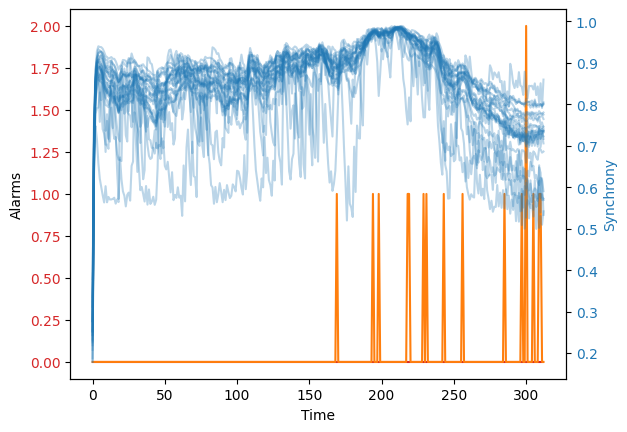

67it [02:17,  2.53s/it]

[nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan]
0.00075


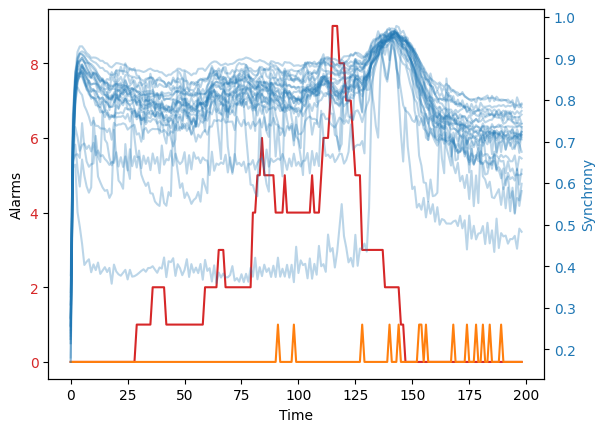

68it [02:19,  2.37s/it]

[ 0.  0.  5.  5.  7.  9. 39. 40. 40. nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan]


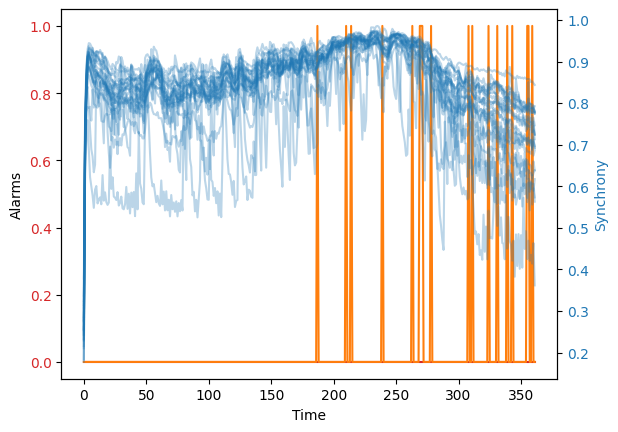

69it [02:23,  2.97s/it]

[nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan]
0.00075


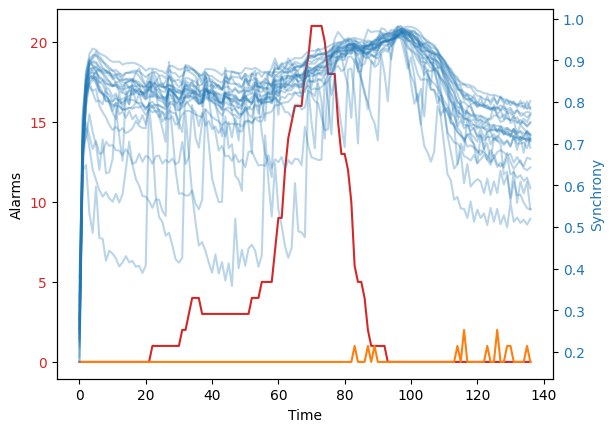

70it [02:24,  2.43s/it]

[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
 nan nan nan nan nan]
0.00075


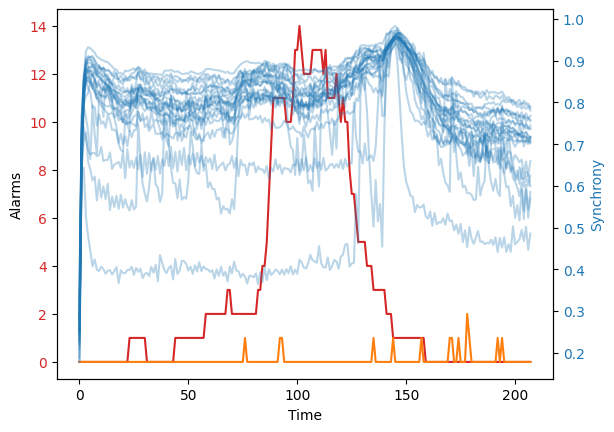

71it [02:27,  2.35s/it]

[ 0.  0.  7.  9. 11. 12. 12. 13. 13. 14. 14. 24. 24. 26. nan nan nan nan
 nan nan nan nan nan]
0.00075


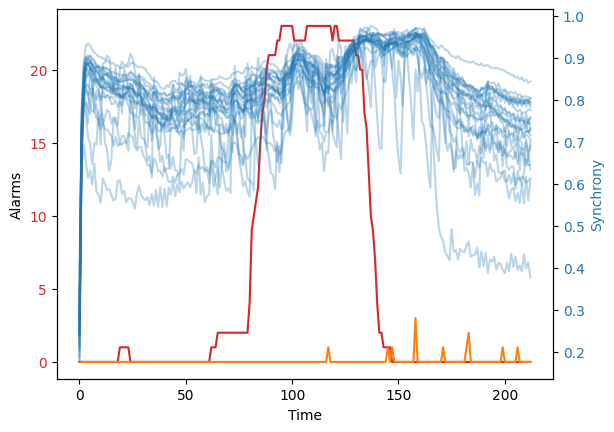

72it [02:29,  2.30s/it]

[ 0.  0.  5.  5.  6.  6.  6.  6.  6.  7.  8.  9. 10. 10. 10. 11. 11. 12.
 13. 13. 14. 18. 20.]
0.00075


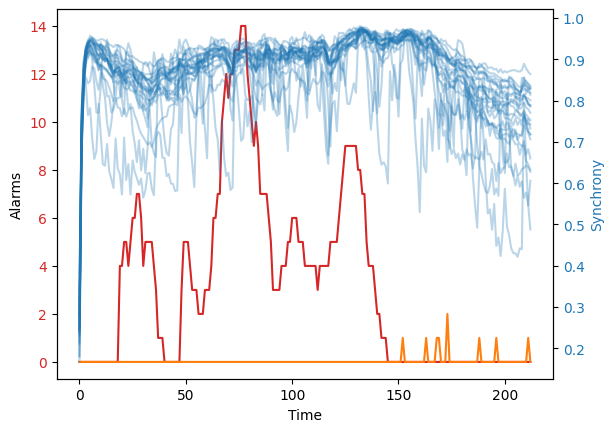

73it [02:31,  2.27s/it]

[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  1. nan nan nan nan
 nan nan nan nan nan]
0.00075


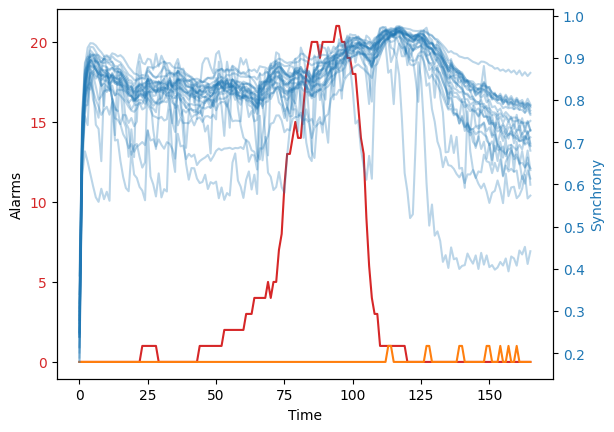

74it [02:33,  2.11s/it]

[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  1.  1.  3.  4.  7.  8.  8.
  9. 10. 19. nan nan]
0.00075


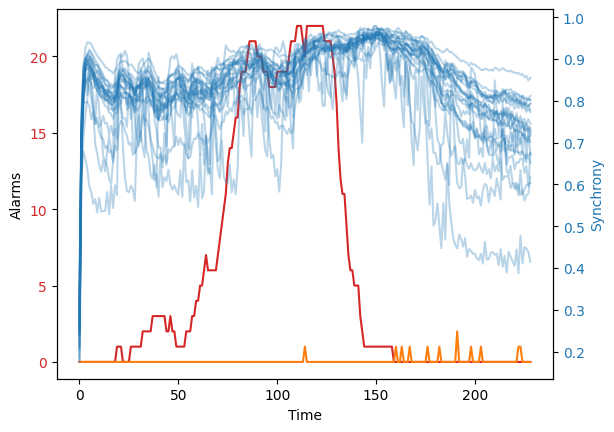

75it [02:35,  2.20s/it]

[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  1.  3.  4.  6.  6.
  7. 10. 11. 35. nan]
0.00075


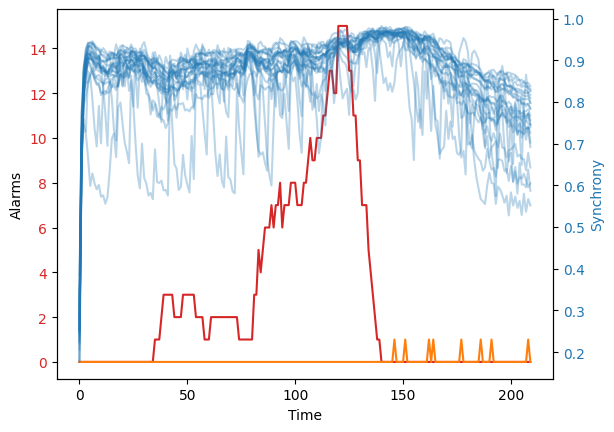

76it [02:37,  2.19s/it]

[ 0.  6.  6.  8.  8. 11. 14. 18. 31. 32. 38. 40. 41. 45. 45. nan nan nan
 nan nan nan nan nan]
0.00075


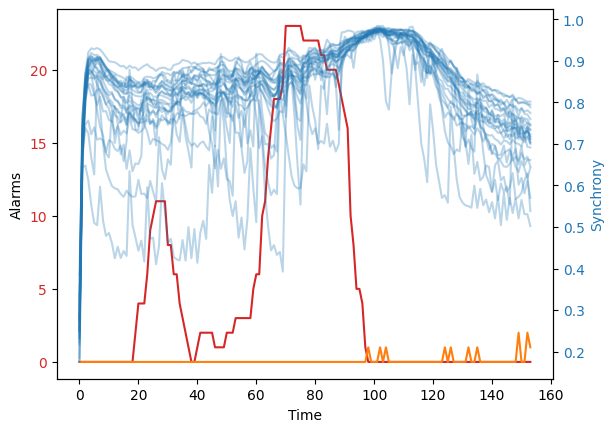

77it [02:39,  1.94s/it]

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
0.00075


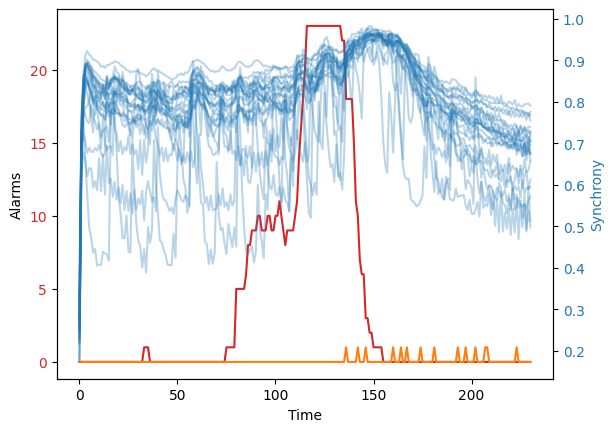

78it [02:41,  2.07s/it]

[ 0.  5.  5.  5.  5. 10. 11. 11. 13. 16. 27. 37. 37. 37. 38. 38. 39. 39.
 40. 40. 41. 41. 41.]
0.00075


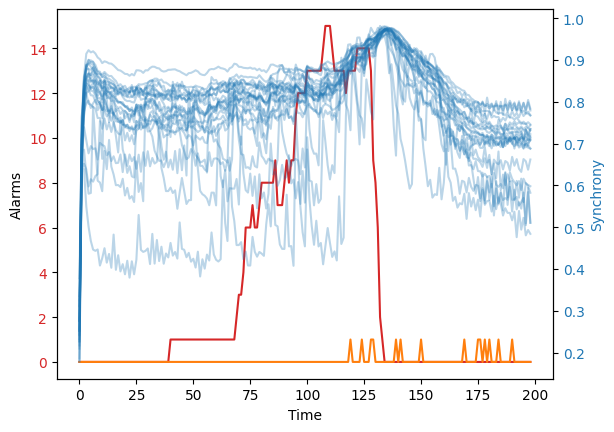

79it [02:43,  2.02s/it]

[ 0.  0.  0.  0.  0.  0.  1.  5. 11. 20. 20. 21. 25. 32. 33. nan nan nan
 nan nan nan nan nan]
0.00075


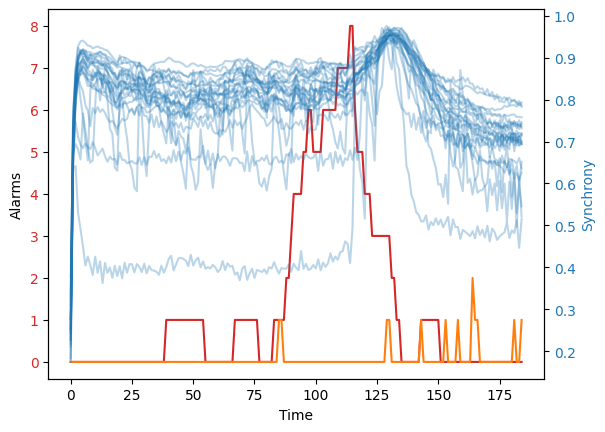

80it [02:45,  2.00s/it]

[ 0. 13. 15. 16. 20. 22. 34. 39. nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan]
0.00075


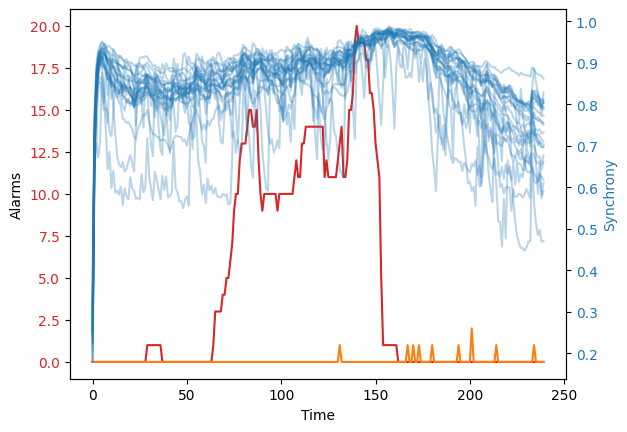

81it [02:47,  2.18s/it]

[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  1.  3.  3.  4.  7.  8. nan nan nan
 nan nan nan nan nan]
0.00075


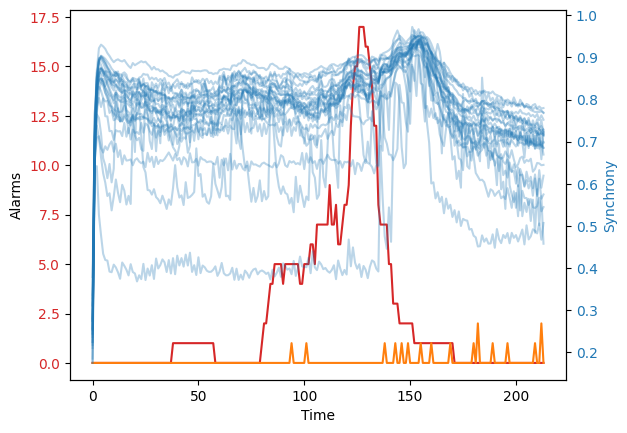

82it [02:50,  2.20s/it]

[ 5.  6.  8.  9. 11. 28. 31. 37. 37. 47. 47. 47. 48. 48. 49. nan nan nan
 nan nan nan nan nan]
0.00075


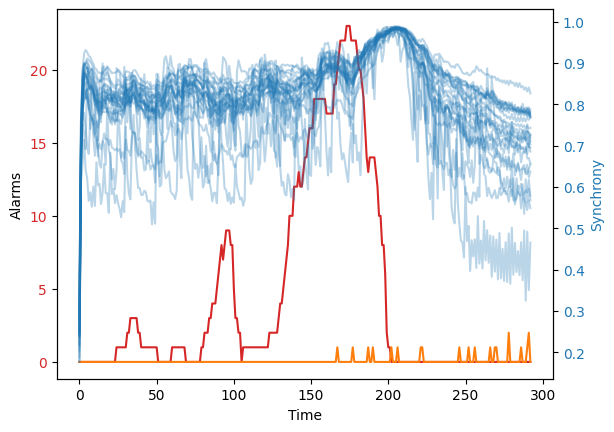

83it [02:53,  2.53s/it]

[ 4.  6.  9. 11. 14. 15. 16. 17. 20. nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan]
0.00075


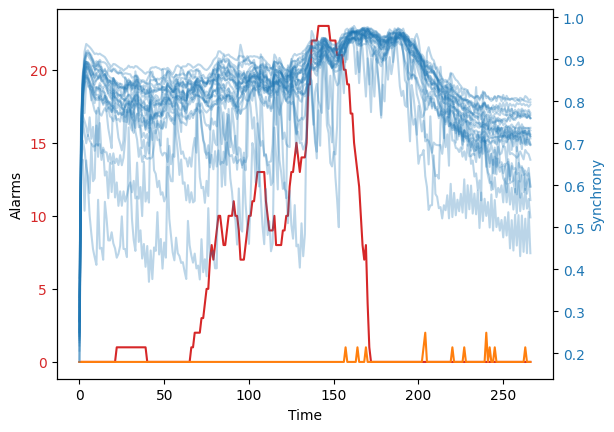

84it [02:56,  2.65s/it]

[ 0.  0.  0.  0.  0.  2.  2.  3.  6.  7. 16. 29. 30. nan nan nan nan nan
 nan nan nan nan nan]
0.00075


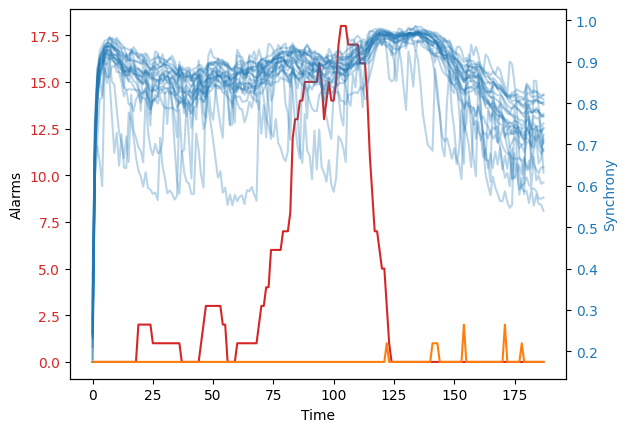

85it [02:58,  2.42s/it]

[ 0.  0.  0.  0.  0.  0.  4.  7.  8.  8.  8.  8.  9. 11. 13. 19. 27. 28.
 nan nan nan nan nan]


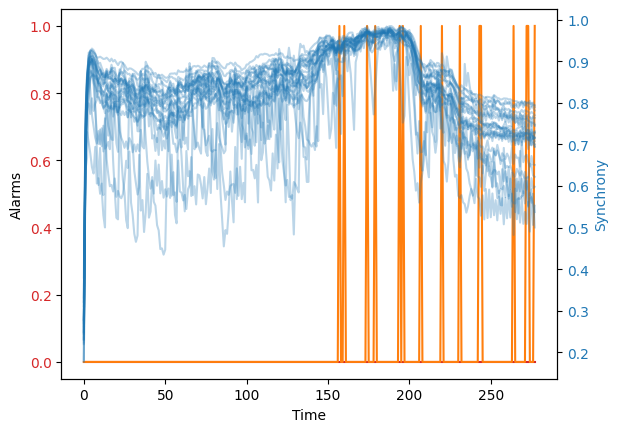

86it [03:01,  2.63s/it]

[nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan]
0.00075


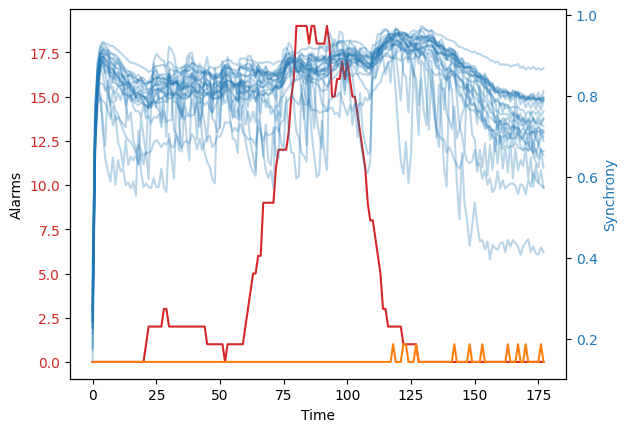

87it [03:03,  2.35s/it]

[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  2.  3.  3.  4.  5.  5.
  5. nan nan nan nan]
0.00075


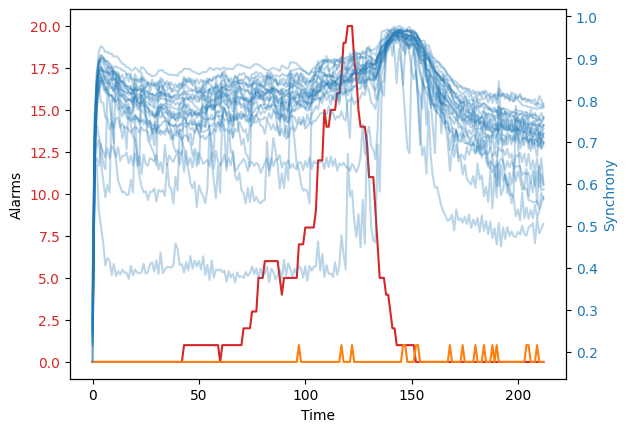

88it [03:05,  2.26s/it]

[ 0.  0.  0.  3.  3.  6. 22. 25. 30. 31. 31. 31. 34. 34. 34. 40. 42. 43.
 43. 45. nan nan nan]
0.00075


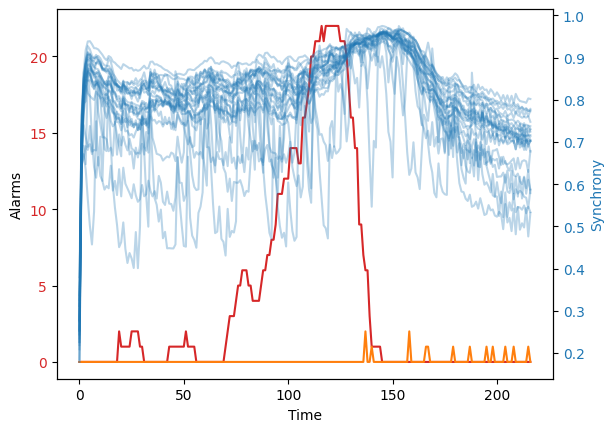

89it [03:07,  2.25s/it]

[ 0.  0.  0.  0.  1.  3. 15. 17. 19. 20. 20. 23. 26. 26. 32. 32. 34. 35.
 36. 36. 38. 41. nan]
0.00075


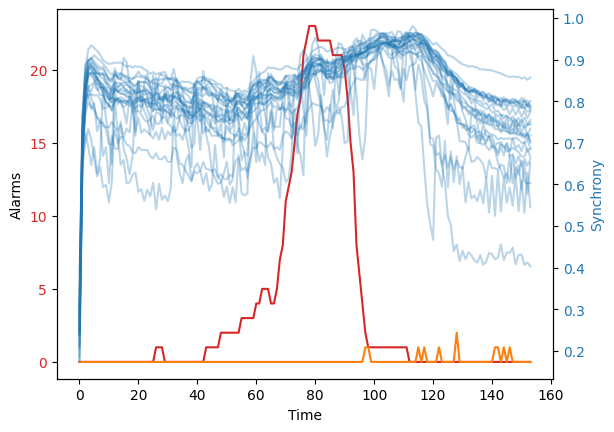

90it [03:08,  1.98s/it]

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 2. 3.]
0.00075


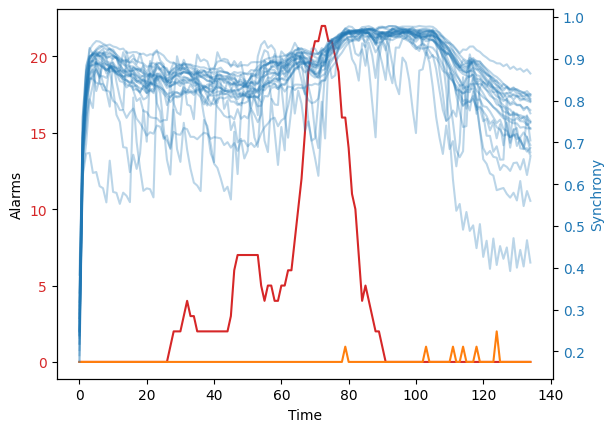

91it [03:09,  1.73s/it]

[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0. nan nan]


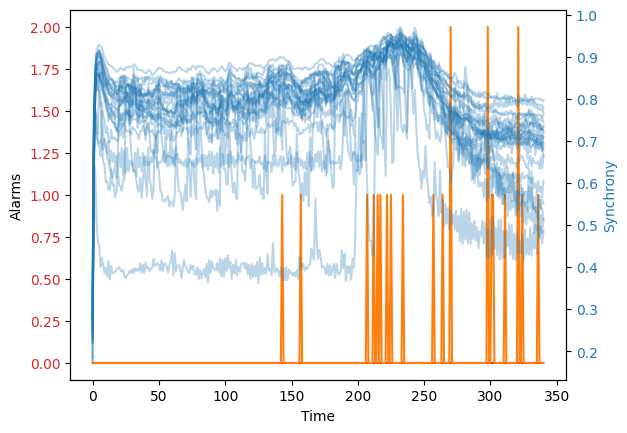

92it [03:13,  2.43s/it]

[nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan]
0.00075


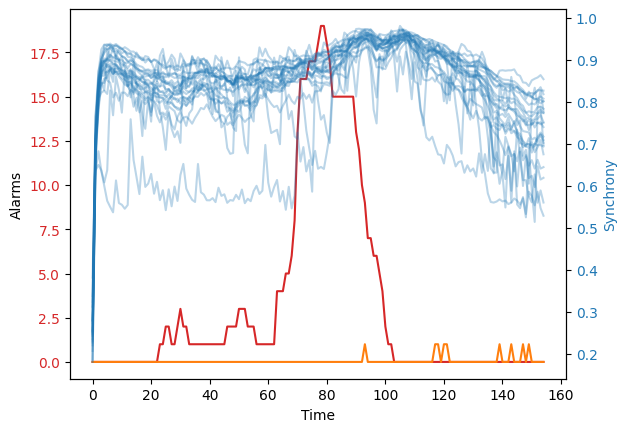

93it [03:15,  2.12s/it]

[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  2.
  3. nan nan nan nan]
0.00075


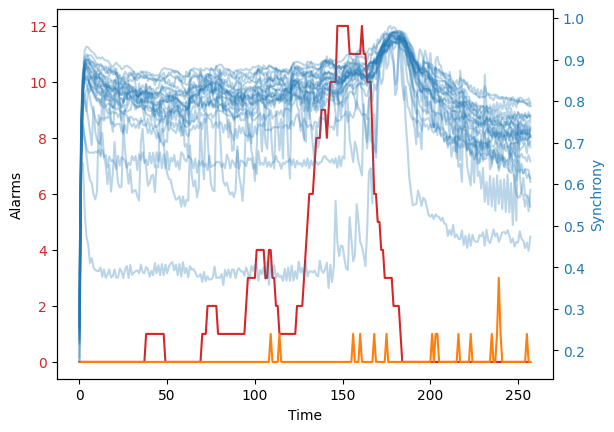

94it [03:18,  2.42s/it]

[ 0.  0. 21. 26. nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan]
0.00075


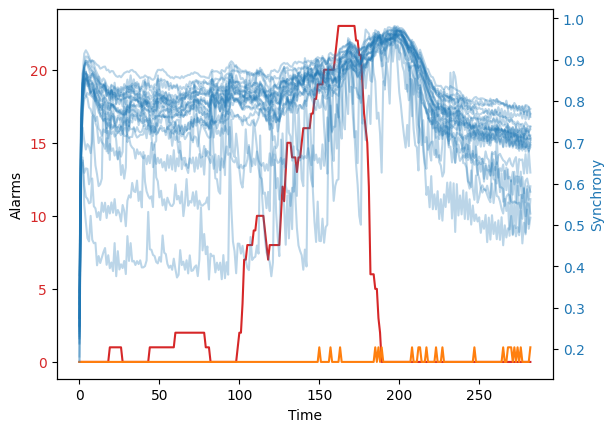

95it [03:21,  2.63s/it]

[ 0.  0. 27. 27. 28. 28. 28. 30. 34. 36. nan nan nan nan nan nan nan nan
 nan nan nan nan nan]


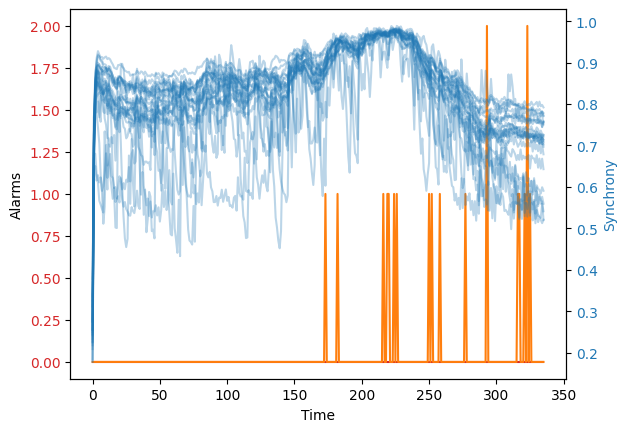

96it [03:25,  3.03s/it]

[nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan]
0.00075


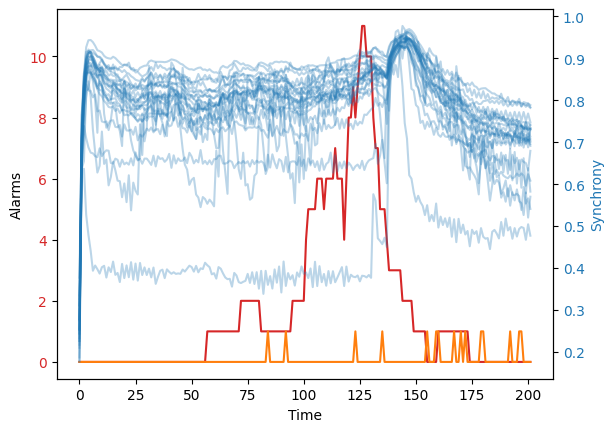

97it [03:27,  2.78s/it]

[ 0.  0. 26. 26. 27. 31. 39. 45. 47. nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan]
0.00075


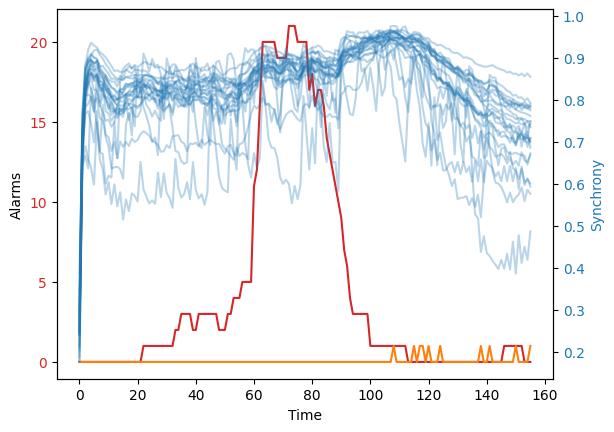

98it [03:29,  2.37s/it]

[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0. nan nan nan]
0.00075


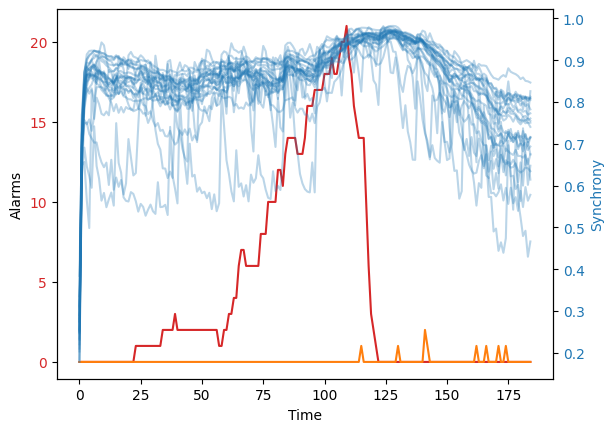

99it [03:31,  2.13s/it]

[ 0.  0.  0.  0.  0.  0.  0.  0.  2.  2.  6.  6.  9. 10. 18. 18. 21. 25.
 28. 32. 34. nan nan]
75
Ours 4 0.7955657223297554 0.7134831460674157 0.898989898989899 6.48314606741573
ADWIN 0 0.8620689655172413 1.0 0.7575757575757576 26.72
DDM 0 0.019801980198019806 0.5 0.010101010101010102 36.0
KSWIN 0 0.9949238578680203 1.0 0.98989898989899 25.489795918367346
PH 0 0.693069306930693 0.5303030303030303 1.0 10.83838383838384
90
Ours 5 0.7225806451612903 0.6086956521739131 0.8888888888888888 5.590909090909091
ADWIN 0 0.8929486758230926 0.9186046511627907 0.8686868686868687 18.372093023255815
DDM 0 0.019801980198019806 0.5 0.010101010101010102 21.0
KSWIN 0 1.0 1.0 1.0 10.787878787878787
PH 0 0.6799999999999999 0.5151515151515151 1.0 10.292929292929292
105
Ours 0 0.5923344947735192 0.4521276595744681 0.8585858585858586 0.8823529411764706
ADWIN 0 0.8366896193322073 0.7608695652173914 0.9292929292929293 16.652173913043477
DDM 0 0.019801980198019806 0.5 0.010101010101010102 6.0
KSWIN 0 0.7058823529

In [17]:
# Run tests (including against other algorithms)

from scipy.stats import theilslopes
from scipy.ndimage import median_filter
from river.drift import ADWIN, binary, KSWIN, PageHinkley

def theil_slopes_detection(data, window_size, min_slope=0.15):
    # Shape must be (channels, t,)
    # First filter
    data = median_filter(data, size=window_size * 4, axes=[-1])
    
    expanded_data = np.zeros(data.shape + (window_size,))
    expanded_data[:, :, 0] = data
    for i in range(1, window_size):
        expanded_data[:, :, i] = np.roll(expanded_data[:, :, i-1], -1, axis=-1)
    
    expanded_data = expanded_data[:, :-window_size + 1]
    stds = np.std(expanded_data, axis=-1)
    
    slopes = theilslopes(expanded_data, axis=-1)
    slopes, ub, lb = slopes.slope, slopes.low_slope, slopes.high_slope

    alarms = np.sum(slopes > min_slope, axis=0)
    # alarms = np.sum(np.logical_or(
    #     np.logical_and(slopes > min_slope, lb > min_slope), np.logical_and(slopes < -min_slope, ub < -min_slope)
    # ), axis=0)
    # alarms = calc_river_alarms(KSWIN, slopes)

    return alarms
    

def calc_river_alarms(alg, data):
    drifts = np.zeros((data.shape[1],))

    for chan in range(data.shape[0]):
        if alg is ADWIN: # Add if statement for mmdagg that adds all the channels, not just one
            a = alg(clock=1)
        else:
            a = alg()

        if alg is MMDAggDriftDetector:
            try:
                for t in range(data.shape[1]):
                    a.update(data[:, t])
                    if a.drift_detected:
                        drifts[t] += 1
            except TypeError:
                pass
        else:
            try:
                for t in range(data.shape[1]):
                    a.update(data[chan, t])
                    if a.drift_detected:
                        drifts[t] += 1
            except ValueError:
                pass
            
    return drifts


far_and_first_alarm = np.zeros((3, 6, len(xs), xs[0].shape[1], 3)) # num ruls, num algo, num trials, num cutoffs, far/first alarm/tpr


for i, (x, rs) in tqdm(enumerate(zip(xs, input_rs))):   
    comp_alarms = []
    for comp in [ADWIN, binary.DDM, KSWIN, PageHinkley]: #, MMDAggDriftDetector]: # 
        comp_alarms.append(calc_river_alarms(comp, x.T))
        
    # Try a couple options
    max_ta_over_fa = 0
    alarms = np.zeros(rs.shape[1])
    for j in [0.00075]: # np.logspace(-4, -2, 10):
        temp_alarms = theil_slopes_detection(rs, 20, min_slope=j)
        if np.sum(temp_alarms[:100]) > 0 and np.sum(temp_alarms[-100:])/np.sum(temp_alarms[:100]) > max_ta_over_fa:
            print(j)
            alarms[-temp_alarms.shape[0]:] = temp_alarms
            max_ta_over_fa = np.sum(temp_alarms[-100:])/np.sum(temp_alarms[:100])
        
    fig, ax1 = plt.subplots()
    ax1.set_xlabel('Time')
    ax1.set_ylabel('Alarms')
    ax1.plot(alarms, color="tab:red")
    for comp in [comp_alarms[0]]:
        ax1.plot(comp, color="tab:orange")
    ax1.tick_params(axis='y', labelcolor="tab:red")
    
    ax2 = ax1.twinx()
    ax2.set_ylabel('Synchrony', color="tab:blue")
    ax2.plot(rs.T, color="tab:blue", alpha=0.3)
    ax2.tick_params(axis='y', labelcolor="tab:blue")
    
    plt.show()

    # Compute stats
    for j, rul in enumerate([75, 90, 105]):
        for k, temp_alarms in enumerate([alarms] + comp_alarms):
            for cutoff in range(xs[0].shape[1]):
                false_alarm_rate = np.sum(temp_alarms[:rul] > cutoff)
                first_true_alarm = np.nonzero(temp_alarms[rul:rul+50] > cutoff)[0]
                if len(first_true_alarm) > 0:
                    far_and_first_alarm[j, k, i, cutoff, 0] = false_alarm_rate > 0
                    far_and_first_alarm[j, k, i, cutoff, 1] = np.min(first_true_alarm)
                    far_and_first_alarm[j, k, i, cutoff, 2] = 1
                else:
                    far_and_first_alarm[j, k, i, cutoff, 0] = false_alarm_rate > 0
                    far_and_first_alarm[j, k, i, cutoff, 1] = np.nan
                    far_and_first_alarm[j, k, i, cutoff, 2] = 0
                    
    print(far_and_first_alarm[0, 0, i, :, 1])

# Find best f1 score for each algorithm for each rul
precision = np.nanmean(far_and_first_alarm[:, :, :, :, 2]/(far_and_first_alarm[:, :, :, :, 2] + far_and_first_alarm[:, :, :, :, 0]), axis=2)
recall = np.nanmean(far_and_first_alarm[:, :, :, :, 2], axis=2)

f1 = (2 * precision * recall)/(precision + recall)

for rul in range(3):
    print([75, 90, 105][rul])
    for algo in range(6):
        try:
            best_cutoff = np.nanargmax(np.round(f1[rul, algo], decimals=2), axis=-1)
            print(
                ["Ours", "ADWIN", "DDM", "KSWIN", "PH", "MMD"][algo], best_cutoff,
                f1[rul, algo, best_cutoff], precision[rul, algo, best_cutoff], recall[rul, algo, best_cutoff],
                np.nanmean(far_and_first_alarm[rul, algo, :, best_cutoff, 1])
            )
        except ValueError:
            pass

for rul in range(2):
    print([70, 85, 100][rul])
    for algo in range(6):
        try:
            best_cutoff = np.nanargmin(np.nanmean(far_and_first_alarm[rul, algo, :, :, 1]), axis=-1)
            print(
                ["Ours", "ADWIN", "DDM", "KSWIN", "PH", "MMD"][algo], best_cutoff,
                f1[rul, algo, best_cutoff], precision[rul, algo, best_cutoff], recall[rul, algo, best_cutoff],
                np.nanmean(far_and_first_alarm[rul, algo, :, best_cutoff, 1])
            )
        except ValueError:
            pass


In [ ]:
example = 54

SMALL_SIZE = 10
MEDIUM_SIZE = 13
BIGGER_SIZE = 20

plt.rc("font", size=SMALL_SIZE)
plt.rc("axes", titlesize=MEDIUM_SIZE, labelsize=MEDIUM_SIZE)
plt.rc("xtick", labelsize=SMALL_SIZE)
plt.rc("ytick", labelsize=SMALL_SIZE)
plt.rc("legend", fontsize=SMALL_SIZE)
plt.rc("figure", titlesize=BIGGER_SIZE)

fig, axs = plt.subplots(2, 1, sharex=True, figsize=(6.4 * 1.5, 4.8 * 1.5))

axs[0].plot(xs[example], alpha=0.5, color="tab:blue")
axs[0].set_ylabel("Z-Scored Sensor Output")
axs[0].set_ylim([-2, 2])
axs[0].axvspan(70, 100, color="grey", alpha=0.3)
axs[0].set_xlim(0, len(xs[example]))

axs[1].plot(input_rs[example].T, alpha=0.5, color="tab:blue")
axs[1].set_xlabel("Time")
axs[1].set_ylabel("Per-Sensor Synchrony")
axs[1].set_ylim([0.5, 1])
axs[1].axvspan(75, 105, color="grey", alpha=0.3)
axs[1].set_xlim(0, len(xs[example]))

# fig.suptitle("Imperceptible Sensor Faults have Large Effects on Synchrony")

plt.tight_layout()
plt.savefig("nasa-sync-amp.pdf")
plt.show()

In [ ]:
# Run significance tests
from lifelines.fitters.coxph_fitter import CoxPHFitter
import pandas as pd


alg_1, thresh_1 = 0, 4
alg_2, thresh_2 = 4, 0

times_1 = np.nan_to_num(far_and_first_alarm[0, alg_1, :, thresh_1, 1], nan=50)
times_2 = np.nan_to_num(far_and_first_alarm[0, alg_2, :, thresh_2, 1], nan=50)

events_1 = ~np.isnan(far_and_first_alarm[0, alg_1, :, thresh_1, 1])
events_2 = ~np.isnan(far_and_first_alarm[0, alg_2, :, thresh_2, 1])

df = pd.DataFrame({
    'time': np.concatenate([times_1, times_2]),
    'event': np.concatenate([events_1, events_2]),
    'group': np.concatenate([np.ones(len(times_1)), np.zeros(len(times_2))])
})

print(np.nanmean(times_1), np.nanmean(times_2))

cph = CoxPHFitter()
cph.fit(df, duration_col='time', event_col='event', formula="group")
cph.print_summary()

In [12]:
# Run driftbench on data
from drift_helpers import added_detectors 
from drift_helpers import added_metrics

from driftbench.drift_detection.detectors import (
    RandomGuessDetector,
    RollingMeanDifferenceDetector,
    RollingMeanStandardDeviationDetector,
    AggregateFeatureAlgorithm,
    SlidingKSWINDetector,
    ClusterDetector,
    AutoencoderDetector,
    MMDDetector,
)
from driftbench.drift_detection.metrics import (
    TemporalAUC,
    SoftTAUC,
    AUC,
)

from river.drift import ADWIN, KSWIN, PageHinkley

detectors = [
    MMDDetector(window_size=(i+1)*5, stat_size=(i+1)*5, offset=10) for i in range(8)
] + [
    AutoencoderDetector(
        hidden_layers=[512, 256, 128, 64, 32, 16, 8],
        retrain_always=True,
        detector=AggregateFeatureAlgorithm(
            agg_feature_func=np.mean,
            algorithm=SlidingKSWINDetector(window_size=20, stat_size=20, offset=10),
        ),
        num_epochs=10,
        batch_size=200,
        lr=0.001,
    )  for i in range(8)
] + [
    AutoencoderDetector(
        hidden_layers=[512, 256, 128, 64, 32, 16, 8],
        retrain_always=True,
        detector=MMDDetector(window_size=(i+1)*5, stat_size=(i+1)*5, offset=10),
        num_epochs=10,
        batch_size=200,
        lr=0.001,
    )  for i in range(8)
] + [
    AutoencoderDetector(
        hidden_layers=[128, 64, 32, 16, 8],
        retrain_always=True,
        detector=AggregateFeatureAlgorithm(
            agg_feature_func=np.mean,
            algorithm=SlidingKSWINDetector(window_size=20, stat_size=20, offset=10),
        ),
        num_epochs=10,
        batch_size=200,
        lr=0.001,
    )  for i in range(8)
] + [
    AutoencoderDetector(
        hidden_layers=[128, 64, 32, 16, 8],
        retrain_always=True,
        detector=MMDDetector(window_size=(i+1)*5, stat_size=(i+1)*5, offset=10),
        num_epochs=10,
        batch_size=200,
        lr=0.001,
    )  for i in range(8)
] + [
    AutoencoderDetector(
        hidden_layers=[64, 32, 16, 8],
        retrain_always=True,
        detector=AggregateFeatureAlgorithm(
            agg_feature_func=np.mean,
            algorithm=SlidingKSWINDetector(window_size=20, stat_size=20, offset=10),
        ),
        num_epochs=10,
        batch_size=200,
        lr=0.001,
    )  for i in range(8)
] + [
    AutoencoderDetector(
        hidden_layers=[64, 32, 16, 8],
        retrain_always=True,
        detector=MMDDetector(window_size=(i+1)*5, stat_size=(i+1)*5, offset=10),
        num_epochs=10,
        batch_size=200,
        lr=0.001,
    )  for i in range(8)
] + [
    ClusterDetector(n_centers=i+1, method="kmeans") for i in range(8)
] + [
    ClusterDetector(n_centers=i+1, method="gaussian mixture") for i in range(8)
]

f1_score = added_metrics.F1_Score()
metrics = [
    f1_score,
    added_metrics.Precision(f1_metric_obj=f1_score),
    added_metrics.Recall(f1_metric_obj=f1_score),
    added_metrics.Delay(f1_metric_obj=f1_score),
    added_metrics.EarlyDetect(f1_metric_obj=f1_score),
    added_metrics.Accuracy(f1_metric_obj=f1_score),
    # TemporalAUC(rule='step'),
    # TemporalAUC(rule='trapez'),
    # SoftTAUC(rule='step'),
    # AUC(),
]

output = []

for detector in tqdm(detectors):
    all_pred_train = []
    all_r_pred_train = []
    all_y_train = []

    all_pred_test = []
    all_r_pred_test = []
    all_y_test = []

    for i in range(len(input_rs)):
        Y = np.zeros((xs[i].shape[0],))
        Y[xs[i].shape[0]//10 * 6:] = 1
        # Y[75:] = 1

        prediction = detector.predict(xs[i])
        r_prediction = detector.predict(input_rs[i].T - np.mean(input_rs[i].T, 0, keepdims=True))

        if i < len(input_rs) * 0.8:
            all_y_train.append(Y)
            all_pred_train.append(prediction)
            all_r_pred_train.append(r_prediction)
        else:
            all_y_test.append(Y)
            all_pred_test.append(prediction)
            all_r_pred_test.append(r_prediction)

    all_pred_train = np.concatenate(all_pred_train, axis=0)
    all_r_pred_train = np.concatenate(all_r_pred_train, axis=0)
    all_y_train = np.concatenate(all_y_train, axis=0)

    all_pred_test = np.concatenate(all_pred_test, axis=0)
    all_r_pred_test = np.concatenate(all_r_pred_test, axis=0)
    all_y_test = np.concatenate(all_y_test, axis=0)

    try:
        f1_score(all_pred_train, all_y_train)
        pred_thresh = f1_score.thresh
        f1_score(all_r_pred_train, all_y_train)
        pred_r_thresh = f1_score.thresh
        
        try:
            output.append({
                "sample": i,
                "detector": detector.name,
                "params": detector.get_hparams(),
                "generic_metrics": {
                    metric.name: metric(all_pred_test, all_y_test, set_threshold=pred_thresh) for metric in metrics
                },
                "r_metrics": {
                    metric.name: metric(all_r_pred_test, all_y_test, set_threshold=pred_r_thresh) for metric in metrics
                }
            })
        except TypeError:
            output.append({
                "sample": i,
                "detector": detector.name,
                "params": detector.get_hparams(),
                "generic_metrics": {
                    metric.name: metric(all_pred_test, all_y_test) for metric in metrics
                },
                "r_metrics": {
                    metric.name: metric(all_r_pred_test, all_y_test) for metric in metrics
                }
            })
    except ValueError:
        pass
    print(detector.name, f1_score.chosen, output[-1]["generic_metrics"]["F1_Score"], output[-1]["r_metrics"]["F1_Score"])

  1%|█▏                                                                                 | 1/72 [00:33<39:29, 33.37s/it]

MMDDetector 0 0.5845697329376854 0.5746856663872589


  3%|██▎                                                                                | 2/72 [00:56<32:10, 27.58s/it]

MMDDetector 0 0.5936911487758945 0.5775989836968028


  4%|███▍                                                                               | 3/72 [01:20<29:32, 25.69s/it]

MMDDetector 0 0.6501117457164143 0.6264274061990213


  6%|████▌                                                                              | 4/72 [01:43<28:03, 24.76s/it]

MMDDetector 0 0.6770589763574956 0.6839872746553552


  7%|█████▊                                                                             | 5/72 [02:07<27:11, 24.35s/it]

MMDDetector 0 0.6835249042145594 0.7179881960482423


  8%|██████▉                                                                            | 6/72 [02:31<26:34, 24.16s/it]

MMDDetector 0 0.6871975362956444 0.7314112291350532


 10%|████████                                                                           | 7/72 [02:55<26:10, 24.16s/it]

MMDDetector 0 0.6102813476901702 0.7303258145363408


 11%|█████████▏                                                                         | 8/72 [03:20<26:05, 24.46s/it]

MMDDetector 0 0.6821521687603697 0.7168831168831169


 12%|██████████▍                                                                        | 9/72 [04:34<42:04, 40.07s/it]

AutoencoderDetector 0 0.7027619465146865 0.6211709965102753


 14%|███████████▍                                                                      | 10/72 [05:49<52:27, 50.77s/it]

AutoencoderDetector 0 0.7068661971830985 0.6252676659528908


 15%|████████████▌                                                                     | 11/72 [07:03<58:54, 57.95s/it]

AutoencoderDetector 0 0.678125 0.6364532019704434


 17%|█████████████▎                                                                  | 12/72 [08:18<1:02:56, 62.95s/it]

AutoencoderDetector 0 0.711141060197664 0.6270476190476191


 18%|██████████████▍                                                                 | 13/72 [09:32<1:05:19, 66.43s/it]

AutoencoderDetector 0 0.7050296507797057 0.6409011458535638


 19%|███████████████▌                                                                | 14/72 [10:46<1:06:30, 68.80s/it]

AutoencoderDetector 0 0.7096029547553093 0.6367627409811033


 21%|████████████████▋                                                               | 15/72 [12:01<1:07:01, 70.55s/it]

AutoencoderDetector 0 0.7233948011552989 0.6357641582622188


 22%|█████████████████▊                                                              | 16/72 [13:16<1:07:00, 71.79s/it]

AutoencoderDetector 0 0.7187570367034452 0.636294608959757


 24%|██████████████████▉                                                             | 17/72 [14:37<1:08:28, 74.70s/it]

AutoencoderDetector 0 0.6975198159038609 0.6030150753768844


 25%|████████████████████                                                            | 18/72 [15:59<1:09:04, 76.75s/it]

AutoencoderDetector 0 0.6929217668972858 0.6152690863579474


 26%|█████████████████████                                                           | 19/72 [17:20<1:08:57, 78.06s/it]

AutoencoderDetector 0 0.7284623773173391 0.6100981767180926


 28%|██████████████████████▏                                                         | 20/72 [18:41<1:08:24, 78.93s/it]

AutoencoderDetector 0 0.750458235140089 0.619023653749371


 29%|███████████████████████▎                                                        | 21/72 [20:00<1:07:14, 79.11s/it]

AutoencoderDetector 0 0.7161803713527851 0.6019615856150388


 31%|████████████████████████▍                                                       | 22/72 [21:20<1:06:09, 79.40s/it]

AutoencoderDetector 0 0.6973389704053718 0.6035182679296347


 32%|█████████████████████████▌                                                      | 23/72 [22:39<1:04:39, 79.18s/it]

AutoencoderDetector 0 0.737226277372263 0.5919187645441084


 33%|██████████████████████████▋                                                     | 24/72 [23:57<1:03:02, 78.81s/it]

AutoencoderDetector 0 0.7317385732592909 0.5923623445825933


 35%|████████████████████████████▍                                                     | 25/72 [24:53<56:18, 71.89s/it]

AutoencoderDetector 0 0.6779497098646036 0.609878844361603


 36%|█████████████████████████████▌                                                    | 26/72 [25:48<51:24, 67.05s/it]

AutoencoderDetector 0 0.6521848951755495 0.6138800075230393


 38%|██████████████████████████████▊                                                   | 27/72 [26:44<47:45, 63.67s/it]

AutoencoderDetector 0 0.7023007204276085 0.6208584337349398


 39%|███████████████████████████████▉                                                  | 28/72 [27:40<44:58, 61.34s/it]

AutoencoderDetector 0 0.7166319685403655 0.6125797629899726


 40%|█████████████████████████████████                                                 | 29/72 [28:35<42:36, 59.46s/it]

AutoencoderDetector 0 0.6577245508982036 0.617424940136305


 42%|██████████████████████████████████▏                                               | 30/72 [29:30<40:34, 57.97s/it]

AutoencoderDetector 0 0.7229142185663925 0.6090183707552421


 43%|███████████████████████████████████▎                                              | 31/72 [30:25<39:01, 57.12s/it]

AutoencoderDetector 0 0.6591928251121076 0.6212061489948758


 44%|████████████████████████████████████▍                                             | 32/72 [31:20<37:47, 56.68s/it]

AutoencoderDetector 0 0.7114885586223165 0.6113989637305699


 46%|█████████████████████████████████████▌                                            | 33/72 [32:23<38:00, 58.47s/it]

AutoencoderDetector 0 0.690275435637999 0.5918792295679333


 47%|██████████████████████████████████████▋                                           | 34/72 [33:26<37:55, 59.89s/it]

AutoencoderDetector 0 0.7431850789096126 0.5953252604900028


 49%|███████████████████████████████████████▊                                          | 35/72 [34:28<37:18, 60.49s/it]

AutoencoderDetector 0 0.7575757575757576 0.6402800215401184


 50%|█████████████████████████████████████████                                         | 36/72 [35:30<36:28, 60.80s/it]

AutoencoderDetector 0 0.7732997481108311 0.6292929292929293


 51%|██████████████████████████████████████████▏                                       | 37/72 [36:31<35:32, 60.93s/it]

AutoencoderDetector 0 0.7039652362846279 0.6229674796747968


 53%|███████████████████████████████████████████▎                                      | 38/72 [37:32<34:35, 61.03s/it]

AutoencoderDetector 0 0.7259510540344075 0.6131832043162092


 54%|████████████████████████████████████████████▍                                     | 39/72 [38:32<33:25, 60.78s/it]

AutoencoderDetector 0 0.709822544363909 0.6282279608192342


 56%|█████████████████████████████████████████████▌                                    | 40/72 [39:32<32:13, 60.42s/it]

AutoencoderDetector 0 0.7025390170044258 0.6312975529508533


 57%|██████████████████████████████████████████████▋                                   | 41/72 [40:23<29:46, 57.62s/it]

AutoencoderDetector 0 0.6103136629452418 0.6324554608830364


 58%|███████████████████████████████████████████████▊                                  | 42/72 [41:14<27:50, 55.67s/it]

AutoencoderDetector 0 0.5920314253647587 0.6081362346263008


 60%|████████████████████████████████████████████████▉                                 | 43/72 [42:06<26:19, 54.48s/it]

AutoencoderDetector 0 0.6335242061426339 0.6176688938381589


 61%|██████████████████████████████████████████████████                                | 44/72 [42:57<24:59, 53.54s/it]

AutoencoderDetector 0 0.6689621249385145 0.6224393910919


 62%|███████████████████████████████████████████████████▎                              | 45/72 [43:49<23:48, 52.92s/it]

AutoencoderDetector 0 0.5931437682699974 0.6205614426473322


 64%|████████████████████████████████████████████████████▍                             | 46/72 [44:40<22:45, 52.52s/it]

AutoencoderDetector 0 0.6516913319238902 0.5992322456813819


 65%|█████████████████████████████████████████████████████▌                            | 47/72 [45:32<21:44, 52.18s/it]

AutoencoderDetector 0 0.6270627062706271 0.6122689736531655


 67%|██████████████████████████████████████████████████████▋                           | 48/72 [46:23<20:44, 51.87s/it]

AutoencoderDetector 0 0.6614609571788413 0.6067289719626168


 68%|███████████████████████████████████████████████████████▊                          | 49/72 [47:22<20:42, 54.04s/it]

AutoencoderDetector 0 0.6803418803418803 0.570499419279907


 69%|████████████████████████████████████████████████████████▉                         | 50/72 [48:20<20:14, 55.20s/it]

AutoencoderDetector 0 0.7208366854384555 0.6130577262414924


 71%|██████████████████████████████████████████████████████████                        | 51/72 [49:17<19:33, 55.87s/it]

AutoencoderDetector 0 0.7506297229219144 0.6219239373601789


 72%|███████████████████████████████████████████████████████████▏                      | 52/72 [50:15<18:46, 56.34s/it]

AutoencoderDetector 0 0.7165580182529334 0.6596377399297106


 74%|████████████████████████████████████████████████████████████▎                     | 53/72 [51:11<17:53, 56.48s/it]

AutoencoderDetector 0 0.7430389817024663 0.6335


 75%|█████████████████████████████████████████████████████████████▌                    | 54/72 [52:08<16:59, 56.62s/it]

AutoencoderDetector 0 0.7275518035303147 0.6568315932818883


 76%|██████████████████████████████████████████████████████████████▋                   | 55/72 [53:04<15:56, 56.24s/it]

AutoencoderDetector 0 0.7319830428638721 0.6377597109304426


 78%|███████████████████████████████████████████████████████████████▊                  | 56/72 [53:59<14:55, 55.96s/it]

AutoencoderDetector 0 0.7168288630429621 0.6369020501138952


 79%|████████████████████████████████████████████████████████████████▉                 | 57/72 [54:06<10:19, 41.33s/it]

ClusterDetector 0 0.5845697329376854 0.8164225941422594


 81%|██████████████████████████████████████████████████████████████████                | 58/72 [54:09<06:56, 29.76s/it]

ClusterDetector 0 0.5845697329376854 0.5845697329376854


 82%|███████████████████████████████████████████████████████████████████▏              | 59/72 [54:17<05:00, 23.12s/it]

ClusterDetector 0 0.5845697329376854 0.5862125971234915


 83%|████████████████████████████████████████████████████████████████████▎             | 60/72 [54:24<03:41, 18.42s/it]

ClusterDetector 0 0.5845697329376854 0.5862125971234915


 85%|█████████████████████████████████████████████████████████████████████▍            | 61/72 [54:33<02:51, 15.62s/it]

ClusterDetector 0 0.5845697329376854 0.5845697329376854


 86%|██████████████████████████████████████████████████████████████████████▌           | 62/72 [54:35<01:55, 11.52s/it]

ClusterDetector 0 0.5845697329376854 0.5845697329376854


 88%|███████████████████████████████████████████████████████████████████████▊          | 63/72 [54:37<01:17,  8.67s/it]

ClusterDetector 0 0.5846661170651278 0.5845697329376854


 89%|████████████████████████████████████████████████████████████████████████▉         | 64/72 [54:40<00:54,  6.79s/it]

ClusterDetector 0 0.5843363561417972 0.5845697329376854


 90%|██████████████████████████████████████████████████████████████████████████        | 65/72 [54:41<00:36,  5.23s/it]

ClusterDetector 0 0.5843363561417972 0.5845697329376854


 92%|███████████████████████████████████████████████████████████████████████████▏      | 66/72 [54:46<00:31,  5.20s/it]

ClusterDetector 0 0.5843363561417972 0.5845697329376854


 93%|████████████████████████████████████████████████████████████████████████████▎     | 67/72 [54:53<00:27,  5.58s/it]

ClusterDetector 0 0.5843363561417972 0.5845697329376854


 94%|█████████████████████████████████████████████████████████████████████████████▍    | 68/72 [55:00<00:24,  6.05s/it]

ClusterDetector 0 0.5843363561417972 0.5845697329376854


 96%|██████████████████████████████████████████████████████████████████████████████▌   | 69/72 [55:08<00:20,  6.77s/it]

ClusterDetector 0 0.5843363561417972 0.5845697329376854


 97%|███████████████████████████████████████████████████████████████████████████████▋  | 70/72 [55:18<00:15,  7.50s/it]

ClusterDetector 0 0.5843363561417972 0.5845697329376854


 99%|████████████████████████████████████████████████████████████████████████████████▊ | 71/72 [55:27<00:08,  8.06s/it]

ClusterDetector 0 0.5843363561417972 0.5845697329376854


100%|██████████████████████████████████████████████████████████████████████████████████| 72/72 [55:37<00:00, 46.35s/it]

ClusterDetector 0 0.5843363561417972 0.5845697329376854


In [13]:
output

[{'sample': 98,
  'detector': 'MMDDetector',
  'params': {},
  'generic_metrics': {'F1_Score': np.float64(0.5845697329376854),
   'Precision': np.float64(0.4129979035639413),
   'Recall': np.float64(1.0),
   'Delay': np.float64(0.0),
   'EarlyDetect': np.float64(132.57894736842104),
   'Accuracy': np.float64(1.0)},
  'r_metrics': {'F1_Score': np.float64(0.5746856663872589),
   'Precision': np.float64(0.4088740458015267),
   'Recall': np.float64(0.9667230682459109),
   'Delay': np.float64(0.0),
   'EarlyDetect': np.float64(101.57894736842105),
   'Accuracy': np.float64(0.9725133938970417)}},
 {'sample': 98,
  'detector': 'MMDDetector',
  'params': {},
  'generic_metrics': {'F1_Score': np.float64(0.5936911487758945),
   'Precision': np.float64(0.5094949494949494),
   'Recall': np.float64(0.7112239142695995),
   'Delay': np.float64(3.3157894736842106),
   'EarlyDetect': np.float64(6.428571428571429),
   'Accuracy': np.float64(0.7614721639878873)},
  'r_metrics': {'F1_Score': np.float64(0.

In [ ]:
# Separate f1 scores by detector and whether using RS
separated_output = {}
for result in output:
    params = ",".join("%s:%s" % (k, v) for k, v in result["params"].items())
    separated_output[result["detector"] + "," + params] = separated_output.get(result["detector"] + "," + params, {
        "generic": [],
        "rs": []
    })

    separated_output[result["detector"] + "," + params]["generic"].append(result["generic_metrics"])
    separated_output[result["detector"] + "," + params]["rs"].append(result["r_metrics"])

print(separated_output[result["detector"] + "," + params]["rs"][0].keys())
for k, v in separated_output.items():
    separated_output[k]["metrics"] = {
        "generic" : {
            k: np.nanmean([i[k] for i in v["generic"]]) for k in v["generic"][0].keys()
        },
        "rs" : {
            k: np.nanmean([i[k] for i in v["rs"]]) for k in v["rs"][0].keys()
        }
    }
    print(k)
    print(separated_output[k]["metrics"])
    print("====================================")

In [ ]:
plt.plot(xs[i])
plt.plot(detectors[0].predict(xs[i]))
# plt.plot(input_rs[i].T - np.mean(input_rs[i].T, 0, keepdims=True))

In [ ]:
# Run significance tests
from lifelines.fitters.coxph_fitter import CoxPHFitter
import pandas as pd
import json

for detector, stats in separated_output.items():
    times_1 = np.asarray([stat["Delay"] for stat in stats["generic"]])
    times_2 = np.asarray([stat["Delay"] for stat in stats["rs"]])

    events_1 = ~np.isnan(times_1)
    events_2 = ~np.isnan(times_2)
    
    df = pd.DataFrame({
        'time': np.concatenate([times_1, times_2]),
        'event': np.concatenate([events_1, events_2]),
        'group': np.concatenate([np.ones(len(times_1)), np.zeros(len(times_2))])
    })
        
    cph = CoxPHFitter()
    cph.fit(df, duration_col='time', event_col='event', formula="group")
    separated_output[detector]["hr"] = float(cph.summary["exp(coef)"])
    separated_output[detector]["p"] = float(cph.summary["p"])

with open("cmapss_results.json", "w") as f:
    json.dump(separated_output, f)